# KL-IG² — Distribution-Space IG²

**KL-IG²** lifts the IG² representation-descent idea from pixel space into
distribution space `(μ, logvar)`.

The path is built by descending the **expected representation distance**:

    L(μ, lv) = E_{x ~ N(μ, exp(lv)·I)} [ ‖φ(x) − φ(x_cf)‖² ]

where `φ` is a hidden-layer activation of the classifier and `x_cf` is a
counterfactual reference image.  Gradients w.r.t. `(μ, lv)` come from the
reparameterisation trick; updates use sign normalisation (fixed step size
regardless of gradient magnitude, matching the original IG² convention).

The resulting trajectory is consumed by the standard `KLIntegratedGradients`
integrator — **no integrator changes** compared to KL-IG.

What the `²` means structurally: each integration step accumulates

    (∂F_target/∂(μ,lv)) · (dμ, dlv)

where `dμ ≈ −lr_μ · sign(∂L_repdist/∂μ)`.  The displacement is the
counterfactual representation gradient.  Attribution is large at pixels where
both the explicand class gradient and the counterfactual contrast gradient
are large and aligned — the "²" (product of two gradient signals) in
distribution space.

**Verification protocol (5 checks) before trusting results:**
1. Loss trajectory — must be monotonically decreasing
2. Path length distribution — early-stopping rate
3. Visual path inspection — μ_k should morph toward the counterfactual class
4. Completeness check — Σ attr ≈ E[F(x)|explicand] − E[F(x)|cf]
5. lv-displacement check — lv must move non-trivially (not a horizontal line)


In [73]:
!git clone --branch claude/general-session-FcgoB \
    https://github.com/Shameen5375/KLIG_V1.git /content/KLIG_V1 2>/dev/null || \
    (cd /content/KLIG_V1 && git pull) 2>/dev/null
import os, sys
for _root in ['/content/KLIG_V1/infocube-main', 'infocube-main', '.']:
    if os.path.isdir(_root) and _root not in sys.path:
        sys.path.insert(0, _root)

Updating c4a764e..985bc6a
Fast-forward
 infocube-main/kl_ig2_demo.ipynb | 242 ++++++++++++++++++----------------------
 1 file changed, 109 insertions(+), 133 deletions(-)


In [74]:
import importlib, os, sys, math, pickle, warnings
from pathlib import Path
from collections import defaultdict

import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
warnings.filterwarnings('ignore')

# Force-reload to avoid stale Colab module cache
import klig.core.rep_descent_path as _rdp_mod
importlib.reload(_rdp_mod)
import klig.core.ig2_integrator as _ig2_mod
importlib.reload(_ig2_mod)
import klig as _klig_mod
importlib.reload(_klig_mod)

from klig import (KLIntegratedGradients, AttributionResult,
                  RepDescentPath, make_phi_from_layer,
                  KLIGSquared, KLIGSquaredResult)
from klig.image.stopping import find_sigma_stop
from klig.core.path import LinearPath
from torchvision.models import resnet50, ResNet50_Weights
print('imports OK')


imports OK


In [75]:
# ── Config ───────────────────────────────────────────────────────────────────
N_IMGS         = 100
SIGMA_FINAL    = 0.25             # σ for KL-IG linear / KL-IG² (fixed)

# RepDescentPath (path-build) hyperparameters
T_DESCENT      = 50               # max descent steps
LR_MU          = 0.05             # sign-normalised step in pixel space
LR_LV          = 0.10             # sign-normalised step in log-variance space
N_MC_DESCENT   = 16               # MC samples per descent step
LOSS_STOP      = 1e-3             # early-stop on descent loss
LV_FLOOR       = 2 * math.log(1 / 256)   # ≈ −11.09  (minimum σ clamp for descent)
LV_CEIL        = 4.0              # σ ≤ ~7.4
# ImageNet-normalised pixel range (3σ rule for each channel):
MU_MIN, MU_MAX = -2.64, 2.64

# KLIntegratedGradients (integration) hyperparameters
N_STEPS_INT    = 50               # quadrature points
N_MC_INT       = 10               # MC samples per integration step

# Evaluation
N_INSERTION_STEPS = 50
VIS_IMG_IDX    = 0
FORCE_RECOMPUTE = False

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'device: {DEVICE}')

try:
    from google.colab import drive
    drive.mount('/content/drive', force_remount=False)
    CACHE_DIR = Path('/content/drive/MyDrive/klig2_dist_cache')
except Exception:
    CACHE_DIR = Path('klig2_dist_cache')
CACHE_DIR.mkdir(parents=True, exist_ok=True)

METHODS = [
    'KLIG-Adaptive',
    'KL-IG (linear)',
    'KL-IG²',
    'KL-IG² (adaptive)',
    ]
COLORS = {
    'KLIG-Adaptive':   '#2d6a2d',
    'KL-IG (linear)':  '#333333',
    'KL-IG²':          '#e41a1c',
    'KL-IG² (adaptive)': '#8b0000',
}

device: cuda
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [76]:
# ── Model + representation extractor ─────────────────────────────────────────
weights  = ResNet50_Weights.IMAGENET1K_V2
model    = resnet50(weights=weights).to(DEVICE).eval()
preprocess   = weights.transforms()
imagenet_labels = weights.meta['categories']

_MEAN = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
_STD  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)
def denormalize(x): return x.cpu() * _STD + _MEAN

def absmax_collapse(a):
    if a.dim() == 4: a = a.squeeze(0)
    idx = a.abs().argmax(dim=0)
    return a.gather(0, idx.unsqueeze(0)).squeeze(0)

# φ = output of layer4 (spatial feature map, 2048×7×7 for 224×224 inputs).
# Flattened inside RepDescentPath to a vector for distance computation.
phi = make_phi_from_layer(model, 'layer4')
print('φ layer: layer4  (ResNet50 last spatial block)')
print('model loaded; ResNet50 ready')

φ layer: layer4  (ResNet50 last spatial block)
model loaded; ResNet50 ready


In [77]:
# ── Dataset ──────────────────────────────────────────────────────────────────
_cache_ds = CACHE_DIR / 'dataset.pkl'
if not FORCE_RECOMPUTE and _cache_ds.exists():
    with open(_cache_ds, 'rb') as f: dataset = pickle.load(f)
    print(f'[cache] dataset n={len(dataset)}')
else:
    from datasets import load_dataset as _hf
    _ds = _hf('evanarlian/imagenet_1k_resized_256', split='train', streaming=True)
    _ds = _ds.shuffle(seed=42, buffer_size=5000)   # <── mix classes before sampling
    dataset = []
    for item in tqdm(_ds.take(N_IMGS * 8), desc='loading'):
        img = item['image']
        if img.mode != 'RGB': img = img.convert('RGB')
        x = preprocess(img).unsqueeze(0).to(DEVICE)
        with torch.no_grad():
            logits = model(x)
            tgt  = int(logits.argmax(-1).item())
            conf = logits.softmax(-1)[0, tgt].item()
        if conf > 0.3:
            dataset.append({'x': x, 'target': tgt, 'idx': len(dataset)})
        if len(dataset) >= N_IMGS: break
    with open(_cache_ds, 'wb') as f: pickle.dump(dataset, f)
    print(f'Collected {len(dataset)} images')

Resolving data files:   0%|          | 0/52 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/52 [00:00<?, ?it/s]

loading: 0it [00:00, ?it/s]

Collected 100 images


In [79]:
FORCE_RECOMPUTE = False

In [80]:
# ── Counterfactual selection: target second-most-likely class ────────────────
# For each explicand x_i:
#   1. Compute model softmax;  y_2 = argmax with the predicted class masked.
#   2. Counterfactual = an image whose model-predicted class equals y_2.
# This is the original IG² recommendation: y_2 is the model's closest competitor,
# so the attribution captures the decision boundary  "what makes this a y rather
# than a y_2?"

_cache_cf = CACHE_DIR / 'cf_y2_pool.pkl'

# (1) y_2 for every explicand
y2_per_idx = []
with torch.no_grad():
    for row in dataset:
        x = row['x'].to(DEVICE)
        probs = model(x).softmax(-1)[0]
        top2  = probs.topk(2).indices.tolist()
        y2    = top2[1] if top2[0] == row['target'] else top2[0]
        y2_per_idx.append(int(y2))

needed_classes = set(y2_per_idx)
print(f'distinct y_2 classes needed: {len(needed_classes)}')

# (2) Build a pool with one cf image per needed class
CF_POOL_MAX_SCAN = 8000   # streaming budget — abort if cannot fill in time
if not FORCE_RECOMPUTE and _cache_cf.exists():
    with open(_cache_cf, 'rb') as f: cf_pool_cpu = pickle.load(f)
    print(f'[cache] cf_pool loaded ({len(cf_pool_cpu)} classes)')
else:
    from datasets import load_dataset as _hf
    _ds = _hf('evanarlian/imagenet_1k_resized_256', split='train', streaming=True)
    cf_pool_cpu = {}
    scanned = 0
    pbar = tqdm(total=len(needed_classes), desc='cf pool')
    for item in _ds:
        scanned += 1
        if len(cf_pool_cpu) >= len(needed_classes) or scanned >= CF_POOL_MAX_SCAN:
            break
        img = item['image']
        if img.mode != 'RGB': img = img.convert('RGB')
        x = preprocess(img).unsqueeze(0).to(DEVICE)
        with torch.no_grad():
            pred = int(model(x).argmax(-1).item())
        if pred in needed_classes and pred not in cf_pool_cpu:
            cf_pool_cpu[pred] = x.cpu()
            pbar.update(1)
    pbar.close()
    with open(_cache_cf, 'wb') as f: pickle.dump(cf_pool_cpu, f)
    print(f'cf_pool built: {len(cf_pool_cpu)}/{len(needed_classes)} classes  '
          f'(scanned {scanned} candidates)')

cf_pool = {k: v.to(DEVICE) for k, v in cf_pool_cpu.items()}

# (3) Accessor — exact y_2 match, with safe fallback
_missing_classes = needed_classes - set(cf_pool.keys())
if _missing_classes:
    print(f'WARNING: {len(_missing_classes)} y_2 classes had no cf image found\n'
          f'  → falling back to any-other-class image for those explicands')

def pick_cf_image(idx):
    """Return cf image (1,C,H,W) whose predicted class == y_2 of explicand idx."""
    y2 = y2_per_idx[idx]
    if y2 in cf_pool:
        return cf_pool[y2]
    # fallback: any cf_pool image whose class differs from this explicand's target
    own_tgt = dataset[idx]['target']
    for k, v in cf_pool.items():
        if k != own_tgt: return v
    raise RuntimeError('cf_pool empty — cannot pick counterfactual')

# Demo
for i in [0, 1, 2]:
    pred_lbl = imagenet_labels[dataset[i]['target']]
    y2_lbl   = imagenet_labels[y2_per_idx[i]]
    matched  = '✓' if y2_per_idx[i] in cf_pool else '(fallback)'
    print(f'img {i}: predicted={pred_lbl!r:30s}  →  y_2={y2_lbl!r:30s}  {matched}')


distinct y_2 classes needed: 46


Resolving data files:   0%|          | 0/52 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/52 [00:00<?, ?it/s]

cf pool:   0%|          | 0/46 [00:00<?, ?it/s]

cf_pool built: 2/46 classes  (scanned 8000 candidates)
  → falling back to any-other-class image for those explicands
img 0: predicted='Crock Pot'                     →  y_2='hot pot'                       (fallback)
img 1: predicted='crib'                          →  y_2='cradle'                        (fallback)
img 2: predicted='crate'                         →  y_2='hamper'                        (fallback)


In [81]:
# ── Attribution loop ─────────────────────────────────────────────────────────
_cache_attr = CACHE_DIR / 'klig2_dist_attrs.pkl'

if not FORCE_RECOMPUTE and _cache_attr.exists():
    with open(_cache_attr, 'rb') as f:
        all_attrs, all_path_meta = pickle.load(f)
    print('[cache] attrs loaded')
else:
    all_attrs     = {m: [] for m in METHODS}
    all_path_meta = []

    ig_linear = KLIntegratedGradients(
        model, n_steps=N_STEPS_INT, n_samples=N_MC_INT,
        sigma_final=SIGMA_FINAL, device=DEVICE)

    for row in tqdm(dataset, desc='attributing'):
        x, tgt = row['x'], row['target']
        x1    = x.squeeze(0).to(DEVICE)
        x_cf  = pick_cf_image(row['idx']).squeeze(0).to(DEVICE)
        meta  = {}

        # shared adaptive sigma for both adaptive methods
        sig_adapt = find_sigma_stop(model, x, tgt, tau=0.95, n_samples=32, n_iter=12)

        # 1) KLIG-Adaptive: LinearPath + adaptive sigma
        r_adapt = KLIntegratedGradients(
            model, n_steps=N_STEPS_INT, n_samples=N_MC_INT,
            sigma_final=sig_adapt, path=LinearPath(), device=DEVICE
        ).attribute(x1, target=tgt)
        all_attrs['KLIG-Adaptive'].append(absmax_collapse(r_adapt.attr).cpu())

        # 2) KL-IG linear (parametric baseline)
        r0 = ig_linear.attribute(x1, target=tgt)
        all_attrs['KL-IG (linear)'].append(absmax_collapse(r0.attr).cpu())

        # 3) KL-IG²: KLIGSquared — forward IG² integration, model-derived baseline
        ig2 = KLIGSquared(
            model, phi, x_cf,
            T=T_DESCENT, lr_mu=LR_MU, lr_lv=LR_LV,
            n_mc_path=N_MC_DESCENT, n_mc_grad=N_MC_INT,
            sigma_start=SIGMA_FINAL, loss_stop=LOSS_STOP,
            lv_floor=LV_FLOOR, lv_ceil=LV_CEIL,
            mu_min=MU_MIN, mu_max=MU_MAX, clamp_samples=True, device=DEVICE)
        r1 = ig2.attribute(x1, target=tgt)
        all_attrs['KL-IG²'].append(absmax_collapse(r1.attr_mu).cpu())
        meta['loss_traj'] = list(r1.loss_trajectory)
        meta['path_len']  = len(r1.traj_mu) - 1
        meta['traj_mu']   = [m.cpu() for m in r1.traj_mu]
        meta['traj_lv']   = [v.cpu() for v in r1.traj_lv]

        all_path_meta.append(meta)

        # 4) KL-IG² (adaptive): KLIGSquared with adaptive sigma_start
        lv_floor_adapt = 2 * math.log(sig_adapt)
        r2 = KLIGSquared(
            model, phi, x_cf,
            T=T_DESCENT, lr_mu=LR_MU, lr_lv=LR_LV,
            n_mc_path=N_MC_DESCENT, n_mc_grad=N_MC_INT,
            sigma_start=sig_adapt, loss_stop=LOSS_STOP,
            lv_floor=lv_floor_adapt, lv_ceil=LV_CEIL,
            mu_min=MU_MIN, mu_max=MU_MAX, clamp_samples=True, device=DEVICE
        ).attribute(x1, target=tgt)
        all_attrs['KL-IG² (adaptive)'].append(absmax_collapse(r2.attr_mu).cpu())

    with open(_cache_attr, 'wb') as f:
        pickle.dump((all_attrs, all_path_meta), f)
    print('Done.')

attributing:   0%|          | 0/100 [00:00<?, ?it/s]

Done.


## Verification 1 — Loss trajectory

Must be **monotonically decreasing**. Oscillation → lower learning rates. Flat → higher learning rates or check φ gradients.

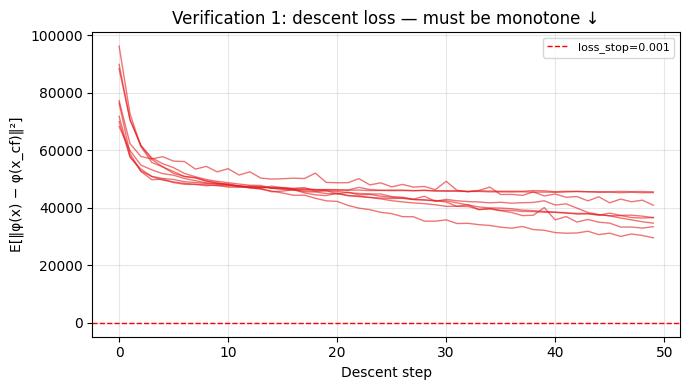

Non-monotone paths: 100/100  (>0 → lr_mu or lr_lv too large)


In [82]:
# ── Verification 1: loss trajectory ──────────────────────────────────────────
N_SHOW = 8
fig, ax = plt.subplots(figsize=(7, 4), facecolor='white')
for i in range(min(N_SHOW, len(all_path_meta))):
    ax.plot(all_path_meta[i]['loss_traj'],
             alpha=0.6, lw=1, color=COLORS['KL-IG²'])
ax.axhline(LOSS_STOP, color='red', lw=1, ls='--', label=f'loss_stop={LOSS_STOP}')
ax.set_xlabel('Descent step'); ax.set_ylabel('E[‖φ(x) − φ(x_cf)‖²]')
ax.set_title('Verification 1: descent loss — must be monotone ↓')
ax.legend(fontsize=8); ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()

n_violate = sum(
    any(b > a + 1e-6 for a, b in zip(m['loss_traj'], m['loss_traj'][1:]))
    for m in all_path_meta
)
print(f'Non-monotone paths: {n_violate}/{len(all_path_meta)}  '
      f'(>0 → lr_mu or lr_lv too large)')


## Verification 4 — Completeness

`Σ attr ≈ E[F(x)|explicand Gaussian] − E[F(x)|cf Gaussian]`.  Relative error > 5 % on most images indicates an integration bug.

completeness:   0%|          | 0/20 [00:00<?, ?it/s]

Completeness check  (n=20)
  mean |err|:  32.5919
  mean rel%:   58297.12%
  pass (<5%):  0.0%


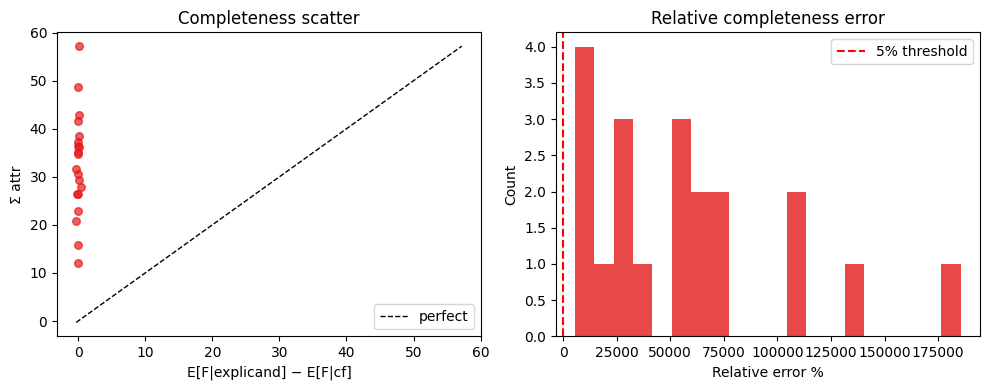

In [83]:
# ── Verification 4: completeness ─────────────────────────────────────────────
N_CC      = 20
N_MC_CC   = 64

def mc_expected_f(model, mu, lv_scalar, target, n=N_MC_CC):
    with torch.no_grad():
        std = math.exp(0.5 * lv_scalar)
        z   = mu.unsqueeze(0) + std * torch.randn(n, *mu.shape, device=mu.device)
        return float(model(z).softmax(-1)[:, target].mean().item())

rows_cc = []
for i, row in enumerate(tqdm(dataset[:N_CC], desc='completeness')):
    x, tgt = row['x'], row['target']
    x1      = x.squeeze(0).to(DEVICE)
    x_cf_i  = pick_cf_image(row['idx']).squeeze(0).to(DEVICE)
    meta    = all_path_meta[i]

    # E[F | explicand Gaussian] at s=1
    f_expl = mc_expected_f(model, x1,     LV_FLOOR, tgt)
    # E[F | cf end of path] at s=0: use the first waypoint from the stored trajectory
    mu_s0  = meta['traj_mu'][0].to(DEVICE)
    lv_s0  = meta['traj_lv'][0].to(DEVICE)
    lv_s0_scalar = float(lv_s0.mean().item())
    f_cf   = mc_expected_f(model, mu_s0, lv_s0_scalar, tgt)

    delta_f   = f_expl - f_cf
    sum_attr  = float(all_attrs['KL-IG²'][i].sum().item())
    rows_cc.append({'delta_f': delta_f, 'sum_attr': sum_attr,
                    'err': abs(sum_attr - delta_f),
                    'rel': abs(sum_attr - delta_f) / (abs(delta_f) + 1e-8) * 100})

err   = np.array([r['err']  for r in rows_cc])
rel   = np.array([r['rel']  for r in rows_cc])
passed = (rel < 5.0).mean() * 100

print(f'Completeness check  (n={N_CC})')
print(f'  mean |err|:  {err.mean():.4f}')
print(f'  mean rel%:   {rel.mean():.2f}%')
print(f'  pass (<5%):  {passed:.1f}%')
if passed < 50:
    print('  WARNING: <50% pass — integration may be buggy; '
          'check n_steps, n_mc_int, or step size.')

fig, axes = plt.subplots(1, 2, figsize=(10, 4), facecolor='white')
delta_fs  = [r['delta_f']  for r in rows_cc]
sum_attrs = [r['sum_attr'] for r in rows_cc]
axes[0].scatter(delta_fs, sum_attrs, alpha=0.7, color=COLORS['KL-IG²'], s=30)
lo, hi = min(delta_fs + sum_attrs), max(delta_fs + sum_attrs)
axes[0].plot([lo, hi], [lo, hi], 'k--', lw=1, label='perfect')
axes[0].set_xlabel('E[F|explicand] − E[F|cf]'); axes[0].set_ylabel('Σ attr')
axes[0].set_title('Completeness scatter'); axes[0].legend()
axes[1].hist(rel, bins=20, color=COLORS['KL-IG²'], alpha=0.8)
axes[1].axvline(5, color='red', lw=1.5, ls='--', label='5% threshold')
axes[1].set_xlabel('Relative error %'); axes[1].set_ylabel('Count')
axes[1].set_title('Relative completeness error'); axes[1].legend()
plt.tight_layout(); plt.show()

## Verification 5 — lv-displacement check

The KL-IG² path in `(μ-disp, lv-disp)` space **must not be horizontal** — if it is, lv never moves and you've effectively re-implemented pixel-space IG². Increase `LR_LV` if lv-displacement ≈ 0.

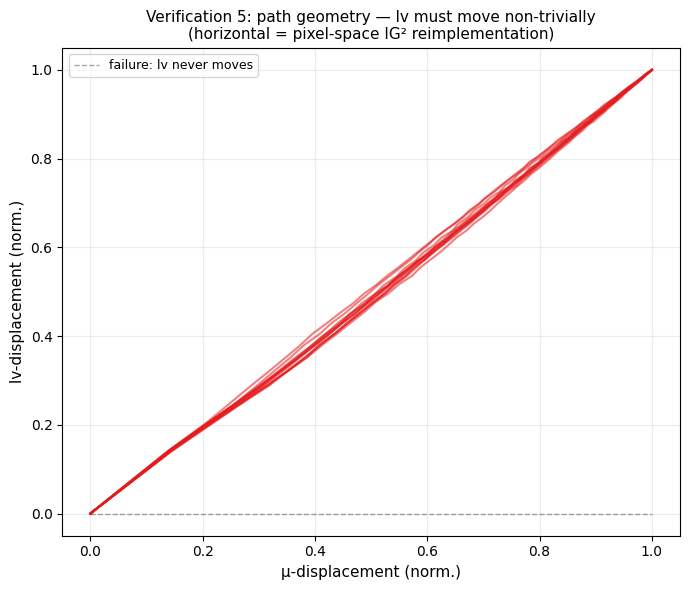

Mean peak lv-displacement (norm.): 1.000
  OK: lv axis is contributing to the path geometry


In [84]:
# ── Verification 5: lv-displacement (path taxonomy figure) ──────────────────
def _norm(v):
    v = np.asarray(v, dtype=float)
    lo, hi = v.min(), v.max()
    return (v - lo) / (hi - lo + 1e-12)

N_SHOW_LV = min(12, len(all_path_meta))
fig, ax   = plt.subplots(figsize=(7, 6), facecolor='white')

lv_disps, mu_disps = [], []
for i in range(N_SHOW_LV):
    meta = all_path_meta[i]
    mu_seq = np.stack([m.flatten().numpy() for m in meta['traj_mu']])
    lv_seq = np.stack([v.flatten().numpy() for v in meta['traj_lv']])
    mu_d   = _norm(np.linalg.norm(mu_seq - mu_seq[0], axis=1))
    lv_d   = _norm(np.linalg.norm(lv_seq - lv_seq[0], axis=1))
    mu_disps.append(float(mu_d.max())); lv_disps.append(float(lv_d.max()))
    ax.plot(mu_d, lv_d, alpha=0.55, lw=1.5, color=COLORS['KL-IG²'])

# horizontal line at lv=0 marks the failure case (pure pixel descent)
ref_mu = np.linspace(0, 1, 100)
ax.plot(ref_mu, np.zeros(100), 'k--', lw=1, alpha=0.35,
         label='failure: lv never moves')

ax.set_xlabel('μ-displacement (norm.)', fontsize=11)
ax.set_ylabel('lv-displacement (norm.)', fontsize=11)
ax.set_title('Verification 5: path geometry — lv must move non-trivially\n'
             '(horizontal = pixel-space IG² reimplementation)', fontsize=11)
ax.legend(fontsize=9); ax.grid(alpha=0.25)
plt.tight_layout(); plt.show()

mean_lv_disp = np.mean(lv_disps)
print(f'Mean peak lv-displacement (norm.): {mean_lv_disp:.3f}')
if mean_lv_disp < 0.05:
    print('  WARNING: lv barely moves — try increasing LR_LV or reducing LOSS_STOP')
else:
    print('  OK: lv axis is contributing to the path geometry')

## Attribution maps

#Metrics

In [14]:
FORCE_RECOMPUTE = False

## Insertion / Deletion AUC

In [15]:
if False:  # COMMENTED OUT — run separately
    # ── Insertion / Deletion AUC ─────────────────────────────────────────────────
    _cache_id = CACHE_DIR / 'klig2_dist_ins_del.pkl'
    
    def insertion_deletion(model, x, attr_map, target, n_steps=N_INSERTION_STEPS):
        C, H, W = x.shape[1], x.shape[2], x.shape[3]
        order   = attr_map.detach().view(-1).abs().argsort(descending=True)
        pps     = max(1, H * W // n_steps)
        blur    = F.avg_pool2d(x, 31, 1, 15)
        x_ins, x_del = blur.clone(), x.clone()
        ins_s, del_s = [], []
        with torch.no_grad():
            for step in range(n_steps):
                pix = order[step * pps:(step + 1) * pps]
                for ch in range(C):
                    x_ins[:, ch].reshape(-1)[pix] = x[:, ch].reshape(-1)[pix]
                    x_del[:, ch].reshape(-1)[pix] = blur[:, ch].reshape(-1)[pix]
                ins_s.append(model(x_ins).softmax(-1)[0, target].item())
                del_s.append(model(x_del).softmax(-1)[0, target].item())
        return float(np.trapz(ins_s) / n_steps), float(np.trapz(del_s) / n_steps)
    
    if not FORCE_RECOMPUTE and _cache_id.exists():
        with open(_cache_id, 'rb') as f: ins_auc, del_auc = pickle.load(f)
    else:
        ins_auc = defaultdict(list); del_auc = defaultdict(list)
        for row in tqdm(dataset, desc='ins/del'):
            x, tgt = row['x'], row['target']
            for m in METHODS:
                attr = all_attrs[m][row['idx']].to(DEVICE).unsqueeze(0)
                i_, d = insertion_deletion(model, x, attr, tgt)
                ins_auc[m].append(i_); del_auc[m].append(d)
        ins_auc, del_auc = dict(ins_auc), dict(del_auc)
        with open(_cache_id, 'wb') as f: pickle.dump((ins_auc, del_auc), f)
    
    fig, axes = plt.subplots(1, 2, figsize=(11, 4), facecolor='white')
    for ax, (title, aucs) in zip(axes, [('Insertion AUC ↑', ins_auc),
                                          ('Deletion AUC ↓', del_auc)]):
        for xi, m in enumerate(METHODS):
            v = aucs[m]; mu_ = np.mean(v); ci = 1.96*np.std(v)/len(v)**0.5
            ax.bar(xi, mu_, color=COLORS[m], alpha=0.85, width=0.6)
            ax.errorbar(xi, mu_, yerr=ci, fmt='none', color='black', capsize=4)
        ax.set_xticks(range(len(METHODS)))
        ax.set_xticklabels(METHODS, rotation=20, ha='right', fontsize=9)
        ax.set_title(title)
    plt.suptitle(f'Insertion / Deletion AUC  (n={N_IMGS})', fontsize=11)
    plt.tight_layout(); plt.show()


ins/del:   0%|          | 0/100 [00:00<?, ?it/s]

KeyboardInterrupt: 

## Sensitivity-n (baseline-matched)

For `KL-IG² (dist)` the path starts at the counterfactual image, so sensitivity-n masks to `x_cf`, not zero.

In [ ]:
if False:  # COMMENTED OUT — run separately
    # ── Sensitivity-n (baseline-matched) ──────────────────────────────────────────
    _cache_sn = CACHE_DIR / 'klig2_dist_sens_n.pkl'
    
    def sensitivity_n(model, x, attr_map, target, baseline,
                      n_subsets=50, subset_size=0.1):
        rng_sn    = np.random.default_rng(42)
        attr_flat = attr_map.cpu().detach().view(-1).numpy()
        n_pix     = attr_flat.size
        n_sel     = max(1, int(n_pix * subset_size))
        df_list, da_list = [], []
        with torch.no_grad():
            f_x = model(x).softmax(-1)[0, target].item()
            for _ in range(n_subsets):
                idx    = rng_sn.choice(n_pix, n_sel, replace=False)
                x_mask = x.clone()
                for ch in range(x.shape[1]):
                    x_mask[:, ch].reshape(-1)[idx] = baseline[:, ch].reshape(-1)[idx]
                f_mask = model(x_mask).softmax(-1)[0, target].item()
                df_list.append(f_x - f_mask)
                da_list.append(float(attr_flat[idx].sum()))
        df, da = np.array(df_list), np.array(da_list)
        if df.std() < 1e-9 or da.std() < 1e-9: return 0.0
        return float(np.corrcoef(df, da)[0, 1])
    
    if not FORCE_RECOMPUTE and _cache_sn.exists():
        with open(_cache_sn, 'rb') as f: sens_n = pickle.load(f)
    else:
        sens_n  = defaultdict(list)
        zeros   = None
        for row in tqdm(dataset, desc='sensitivity-n'):
            x, tgt = row['x'], row['target']
            if zeros is None: zeros = torch.zeros_like(x)
            x_cf_i  = pick_cf_image(row['idx']).to(DEVICE)
            x_cf_i_4d = x_cf_i if x_cf_i.dim() == 4 else x_cf_i.unsqueeze(0)
            baselines = {m: zeros for m in METHODS}
            baselines['KL-IG²'] = x_cf_i_4d
            baselines['KL-IG² (adaptive)'] = x_cf_i_4d
            for m in METHODS:
                if m not in all_attrs or row['idx'] >= len(all_attrs[m]): continue
                attr = all_attrs[m][row['idx']].to(DEVICE).unsqueeze(0)
                sens_n[m].append(sensitivity_n(model, x, attr, tgt, baselines[m]))
        sens_n = dict(sens_n)
        with open(_cache_sn, 'wb') as f: pickle.dump(sens_n, f)
    
    fig, ax = plt.subplots(figsize=(7, 4), facecolor='white')
    for xi, m in enumerate(METHODS):
        v = sens_n[m]; mu_ = np.mean(v); ci = 1.96*np.std(v)/len(v)**0.5
        ax.bar(xi, mu_, color=COLORS[m], alpha=0.85, width=0.6)
        ax.errorbar(xi, mu_, yerr=ci, fmt='none', color='black', capsize=4)
    ax.set_xticks(range(len(METHODS)))
    ax.set_xticklabels(METHODS, rotation=20, ha='right', fontsize=9)
    ax.axhline(0, color='black', lw=0.5)
    ax.set_ylabel('Pearson r (signed)')
    ax.set_title(f'Sensitivity-n (baseline-matched,  n={len(dataset)})')
    plt.tight_layout(); plt.show()


## Sparsity (Gini)

In [ ]:
if False:  # COMMENTED OUT — run separately
    # ── Sparsity (Gini) ──────────────────────────────────────────────────────────
    def gini(v):
        v = v.abs().flatten().numpy(); v = np.sort(v); n = len(v)
        return float((2*np.arange(1,n+1) - n - 1) @ v / (n * v.sum() + 1e-12))
    
    gini_scores = {m: [gini(all_attrs[m][i]) for i in range(len(dataset))]
                   for m in METHODS}
    
    fig, ax = plt.subplots(figsize=(7, 4), facecolor='white')
    for xi, m in enumerate(METHODS):
        v = gini_scores[m]; mu_ = np.mean(v); ci = 1.96*np.std(v)/len(v)**0.5
        ax.bar(xi, mu_, color=COLORS[m], alpha=0.85, width=0.6)
        ax.errorbar(xi, mu_, yerr=ci, fmt='none', color='black', capsize=4)
    ax.set_xticks(range(len(METHODS)))
    ax.set_xticklabels(METHODS, rotation=20, ha='right', fontsize=9)
    ax.set_ylabel('Gini ↑'); ax.set_title(f'Sparsity  (n={len(dataset)})')
    plt.tight_layout(); plt.show()


## OFR (Object Focus Ratio)

Measures what fraction of the total attribution mass lands **inside the object region**.
The object mask is estimated via GrabCut seeded by the reference method's (KL-IG linear)
attribution map.  A higher OFR means the method concentrates its attributions on the
object rather than on background pixels.

    OFR = Σ |attr[mask]| / Σ |attr|

In [ ]:
if False:  # COMMENTED OUT — run separately
    # ── OFR (Object Focus Ratio) ──────────────────────────────────────────────────
    import cv2
    
    _cache_ofr = CACHE_DIR / 'klig2_dist_ofr.pkl'
    
    def estimate_object_mask(x, attr_map):
        """GrabCut-based object mask seeded by attribution percentiles."""
        H, W = attr_map.shape
        a    = np.abs(attr_map.detach().cpu().numpy())
        seed = (a >= np.percentile(a, 80)).astype(np.uint8)
        img_rgb = np.clip(denormalize(x[0]).detach().cpu().permute(1,2,0).numpy(), 0, 1)
        img_bgr = (img_rgb * 255).clip(0, 255).astype(np.uint8)[:, :, ::-1].copy()
        gc_mask = np.where(seed, cv2.GC_PR_FGD, cv2.GC_PR_BGD).astype(np.uint8)
        gc_mask[(a >= np.percentile(a, 95))] = cv2.GC_FGD
        border  = max(H, W) // 10
        edge    = np.zeros((H, W), dtype=np.uint8)
        edge[:border, :] = 1; edge[-border:, :] = 1
        edge[:, :border] = 1; edge[:, -border:] = 1
        gc_mask[(edge == 1) & (a < np.percentile(a, 10))] = cv2.GC_BGD
        try:
            bgd = np.zeros((1, 65), np.float64)
            fgd = np.zeros((1, 65), np.float64)
            cv2.grabCut(img_bgr, gc_mask, None, bgd, fgd, 5, cv2.GC_INIT_WITH_MASK)
            return np.where((gc_mask == cv2.GC_FGD) | (gc_mask == cv2.GC_PR_FGD),
                            1, 0).astype(np.uint8)
        except Exception:
            return seed
    
    def object_focus_ratio(attr_map, obj_mask):
        """Fraction of |attr| mass inside the object mask."""
        a = np.abs(attr_map.detach().cpu().numpy())
        total = a.sum()
        return float(a[obj_mask == 1].sum() / total) if total > 1e-12 else 0.0
    
    if not FORCE_RECOMPUTE and _cache_ofr.exists():
        with open(_cache_ofr, 'rb') as f: ofr_scores = pickle.load(f)
        print(f'[cache] OFR loaded')
    else:
        ofr_scores = {m: [] for m in METHODS}
        for row in tqdm(dataset, desc='OFR'):
            x, tgt = row['x'], row['target']
            # Reference mask: use KL-IG (linear) attribution as GrabCut seed
            ref_attr = all_attrs['KL-IG (linear)'][row['idx']].to(DEVICE)
            obj_mask = estimate_object_mask(x, ref_attr)
            for m in METHODS:
                attr = all_attrs[m][row['idx']]
                ofr_scores[m].append(object_focus_ratio(attr, obj_mask))
        with open(_cache_ofr, 'wb') as f: pickle.dump(ofr_scores, f)
        print('OFR computed and cached.')
    
    # ── Plot ──────────────────────────────────────────────────────────────────────
    fig, ax = plt.subplots(figsize=(7, 4.5), facecolor='white')
    for xi, m in enumerate(METHODS):
        v   = ofr_scores[m]
        mu_ = np.mean(v)
        ci  = 1.96 * np.std(v) / len(v) ** 0.5
        ax.bar(xi, mu_, color=COLORS[m], alpha=0.88, width=0.6,
               edgecolor='white', linewidth=0.8)
        ax.errorbar(xi, mu_, yerr=ci, fmt='none', color='#333333', capsize=4)
    
    ax.yaxis.grid(True, linestyle='--', alpha=0.3, zorder=0)
    ax.set_axisbelow(True)
    ax.set_xticks(range(len(METHODS)))
    ax.set_xticklabels(METHODS, rotation=15, ha='right', fontsize=10)
    ax.set_ylabel('OFR ↑  (fraction of |attr| inside object)', fontsize=10)
    ax.set_ylim(0, 1.0)
    ax.set_title(f'Object Focus Ratio  (n={len(dataset)})', fontsize=12)
    plt.tight_layout(); plt.show()
    
    for m in METHODS:
        v = ofr_scores[m]
        print(f'{m:25s}  mean={np.mean(v):.3f}  ci95=±{1.96*np.std(v)/len(v)**0.5:.3f}')


#Class Sens

In [91]:
FORCE_RECOMPUTE = True

In [92]:
# ── Class Sensitivity Scatter — Step 1: filter multi-class images ────────────
import itertools
import nltk; nltk.download('wordnet', quiet=True)
from nltk.corpus import wordnet as wn
from scipy.stats import spearmanr

CS_PROB_THRESH = 0.1
CS_MAX_IMGS    = 10000
CS_MAX_SCAN    = 16000
NON_ANIMAL_CLS = set(range(400, 1000))

_cache_multi = CACHE_DIR / 'klig2_dist_multiprob.pkl'

def label_to_synset(label):
    phrase = label.lower().split(',')[0].strip()
    cands  = []
    for candidate in [phrase.replace(' ', '_'), phrase]:
        cands.extend(wn.synsets(candidate, pos=wn.NOUN))
    if not cands:
        for w in sorted(phrase.split(), key=len, reverse=True):
            if len(w) > 3:
                cands.extend(wn.synsets(w, pos=wn.NOUN))
                if cands: break
    if not cands: return None
    return max(cands, key=lambda s: s.min_depth())

cls_synsets = {i: label_to_synset(imagenet_labels[i]) for i in range(1000)}

def cosine_dist_cs(a_i, a_j):
    ai = np.clip(a_i.astype(np.float64).ravel(), 0, None)
    aj = np.clip(a_j.astype(np.float64).ravel(), 0, None)
    denom = np.linalg.norm(ai) * np.linalg.norm(aj)
    if denom < 1e-12: return 1.0
    return float(1.0 - (ai @ aj) / denom)

if not FORCE_RECOMPUTE and _cache_multi.exists():
    multi_imgs = pickle.load(open(_cache_multi, 'rb'))
    print(f'[cache] {len(multi_imgs)} multi-class images')
else:
    from datasets import load_dataset as _hf
    _ds_cs = _hf('evanarlian/imagenet_1k_resized_256', split='train', streaming=True)
    _ds_cs = _ds_cs.shuffle(seed=42, buffer_size=5000)
    multi_imgs = []
    scanned = 0
    for item in tqdm(_ds_cs, desc='scanning for multi-class', total=CS_MAX_SCAN):
        if len(multi_imgs) >= CS_MAX_IMGS or scanned >= CS_MAX_SCAN:
            break
        scanned += 1
        img = item['image']
        if img.mode != 'RGB': img = img.convert('RGB')
        x = preprocess(img).unsqueeze(0).to(DEVICE)
        with torch.no_grad():
            probs = model(x).softmax(-1)[0].cpu()
        high = (probs > CS_PROB_THRESH).nonzero(as_tuple=True)[0].tolist()
        if len(high) < 2: continue
        if high[0] not in NON_ANIMAL_CLS: continue
        high = sorted(high, key=lambda c: probs[c].item(), reverse=True)
        sig_adapt = find_sigma_stop(model, x, high[0], tau=0.95,
                                    n_samples=32, n_iter=12)
        multi_imgs.append({
            'idx':        len(multi_imgs),
            'x':          x,
            'high_cls':   high,
            'high_probs': [probs[c].item() for c in high],
            'sig_adapt':  sig_adapt,
        })
    pickle.dump(multi_imgs, open(_cache_multi, 'wb'))
    print(f'Found {len(multi_imgs)} multi-class images '
          f'(scanned {scanned}, thresh={CS_PROB_THRESH})')

n_pairs_total = sum(
    len(list(itertools.combinations(d['high_cls'], 2))) for d in multi_imgs
)
print(f'Total class pairs: {n_pairs_total}')

Resolving data files:   0%|          | 0/52 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/52 [00:00<?, ?it/s]

scanning for multi-class:   0%|          | 0/16000 [00:00<?, ?it/s]

Found 2243 multi-class images (scanned 16000, thresh=0.1)
Total class pairs: 2466


In [93]:
# ── Class Sensitivity Scatter — Step 2: attribution + cosine distance ────────
# x-axis: CLIP cosine distance between class text embeddings (replaces WordNet)
_cache_scatter   = CACHE_DIR / 'klig2_dist_cs_scatter_clip.pkl'
_cache_scatter_n = CACHE_DIR / 'klig2_dist_cs_scatter_clip_n.pkl'


import torch.nn.functional as _F
from transformers import CLIPModel, CLIPTokenizerFast

_clip_mdl = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(DEVICE).eval()
_clip_tok = CLIPTokenizerFast.from_pretrained("openai/clip-vit-base-patch32")
_labels_text = [f"a photo of a {lbl.split(',')[0].strip()}" for lbl in imagenet_labels]

_clip_emb_parts = []
_BS = 64
with torch.no_grad():
    for _i in range(0, len(_labels_text), _BS):
        _inp = _clip_tok(_labels_text[_i:_i+_BS],
                         return_tensors="pt", padding=True,
                         truncation=True, max_length=77).to(DEVICE)
        _feat = _clip_mdl.text_model(
            input_ids=_inp['input_ids'],
            attention_mask=_inp['attention_mask'],
        ).pooler_output  # (B, 512) — robust across transformers versions
        _clip_emb_parts.append(_feat.float().cpu())
_clip_emb = _F.normalize(torch.cat(_clip_emb_parts, dim=0), dim=-1)  # (1000, 512)
print(f"CLIP embeddings: {_clip_emb.shape}")

def clip_semantic_dist(ci, cj):
    """1 - cosine-sim between CLIP text embeddings of two ImageNet class indices."""
    return float(1.0 - (_clip_emb[ci] * _clip_emb[cj]).sum().item())

# ── Select multi_imgs_scatter with CLIP-bin diversity ────────────────────────
CLIP_BINS_SCATTER   = [(0.0, 0.20), (0.20, 0.35), (0.35, 0.50), (0.50, 0.70), (0.70, 1.01)]
MAX_PER_BIN_SCATTER = 20   # up to 10 images per CLIP distance bin → up to 50 total

_scatter_buckets = {i: [] for i in range(len(CLIP_BINS_SCATTER))}
for _d in multi_imgs:
    if not _d.get('high_cls') or len(_d['high_cls']) < 2:
        continue
    _cd = _d.get('clip_dist')
    if _cd is None:
        _cd = clip_semantic_dist(_d['high_cls'][0], _d['high_cls'][1])
    _bin = next((i for i, (lo, hi) in enumerate(CLIP_BINS_SCATTER)
                 if lo <= _cd < hi), None)
    if _bin is None:
        continue
    if len(_scatter_buckets[_bin]) < MAX_PER_BIN_SCATTER:
        _scatter_buckets[_bin].append(_d)

multi_imgs_scatter = [d for bucket in _scatter_buckets.values() for d in bucket]
print(f"multi_imgs_scatter: {len(multi_imgs_scatter)} images across "
      f"{sum(1 for b in _scatter_buckets.values() if b)} CLIP bins")
for _bi, (lo, hi) in enumerate(CLIP_BINS_SCATTER):
    print(f"  [{lo:.2f},{hi:.2f}): {len(_scatter_buckets[_bi])}")

# ── Cheap settings for the scatter ───────────────────────────────────────────
N_STEPS_SCATTER   = 25
N_MC_SCATTER      = 3
T_DESCENT_SCATTER = 25
N_MC_DESC_SCATTER = 8

# ── Shared linear integrator ──────────────────────────────────────────────────
ig_linear_cs2 = KLIntegratedGradients(
    model, n_steps=N_STEPS_SCATTER, n_samples=N_MC_SCATTER,
    sigma_final=SIGMA_FINAL, device=DEVICE)


def _pick_cf_scatter(d):
    """Use stored high_cls[1] as y2 — avoids y2_per_idx index bounds."""
    y2 = d['high_cls'][1] if len(d['high_cls']) > 1 else d['high_cls'][0]
    if y2 in cf_pool:
        return cf_pool[y2]
    return next(iter(cf_pool.values()))  # fallback to any available cf


def _build_klig2(x_cf_img, sigma_start, lv_floor):
    return KLIGSquared(
        model, phi, x_cf_img,
        T=T_DESCENT_SCATTER, lr_mu=LR_MU, lr_lv=LR_LV,
        n_mc_path=N_MC_DESC_SCATTER, n_mc_grad=N_MC_SCATTER,
        sigma_start=sigma_start, loss_stop=LOSS_STOP,
        lv_floor=lv_floor, lv_ceil=LV_CEIL,
        mu_min=MU_MIN, mu_max=MU_MAX, clamp_samples=True, device=DEVICE,
    )


def _build_gradpath_once(klig2_obj, x1):
    """Descent only depends on x1 + x_cf — independent of target class."""
    x1d = x1.to(DEVICE)
    if x1d.dim() > 1 and x1d.shape[0] == 1:
        x1d = x1d.squeeze(0)
    traj_mu, traj_lv, _ = klig2_obj._build_gradpath(x1d, x1d.shape)
    return traj_mu, traj_lv


def _klig2_integrate_only(klig2_obj, x1, target, traj_mu, traj_lv):
    """
    Integration phase only on a precomputed GradPath.
    Uses backward displacement (x_k - x_{k+1}) to match IG2 sign convention.
    Returns attr_mu only (consistent with main attribution loop).
    """
    klig2_obj.model.eval()
    x1d = x1.to(DEVICE)
    if x1d.dim() > 1 and x1d.shape[0] == 1:
        x1d = x1d.squeeze(0)

    _, objective_fn = klig2_obj._resolve_target(x1d, int(target))

    saved = [p.requires_grad for p in klig2_obj.model.parameters()]
    for p in klig2_obj.model.parameters():
        p.requires_grad_(False)

    attr_mu_sum = torch.zeros_like(x1d)
    try:
        K = len(traj_mu) - 1
        for k in range(K):
            dmu_k = traj_mu[k] - traj_mu[k + 1]
            lv_k  = traj_lv[k]
            g_mu, _ = klig2_obj._eval_gradients(
                traj_mu[k], lv_k, x1d.shape, objective_fn)
            with torch.no_grad():
                attr_mu_sum.add_(g_mu * dmu_k)
    finally:
        for p, s in zip(klig2_obj.model.parameters(), saved):
            p.requires_grad_(s)

    return attr_mu_sum


def _attr_for_class_fast(m_name, x1, tgt_cls, klig2_fixed=None, klig2_adapt=None,
                          path_fixed=None, path_adapt=None, sig_adapt=None):
    if m_name == 'KLIG-Adaptive':
        _sa = sig_adapt or SIGMA_FINAL
        r = KLIntegratedGradients(model,
            n_steps=N_STEPS_SCATTER, n_samples=N_MC_SCATTER,
            sigma_final=_sa, path=LinearPath(), device=DEVICE
        ).attribute(x1, target=int(tgt_cls))
        attr = r.attr
    elif m_name == 'KL-IG (linear)':
        r = ig_linear_cs2.attribute(x1, target=int(tgt_cls))
        attr = r.attr
    elif m_name == 'KL-IG²':
        attr = _klig2_integrate_only(
            klig2_fixed, x1, int(tgt_cls), path_fixed[0], path_fixed[1])
    elif m_name == 'KL-IG² (adaptive)':
        attr = _klig2_integrate_only(
            klig2_adapt, x1, int(tgt_cls), path_adapt[0], path_adapt[1])
    else:
        raise ValueError(f'Unknown method: {m_name}')
    return absmax_collapse(attr).cpu().numpy().ravel()


# ── Resume ────────────────────────────────────────────────────────────────────
if not FORCE_RECOMPUTE and _cache_scatter.exists():
    scatter_all = pickle.load(open(_cache_scatter, 'rb'))
    done_n      = pickle.load(open(_cache_scatter_n, 'rb'))
    print(f'[resume] {sum(len(v) for v in scatter_all.values())} points, '
          f'{done_n}/{len(multi_imgs_scatter)} images done')
else:
    scatter_all = {m: [] for m in METHODS}
    done_n      = 0

# ── Main loop ────────────────────────────────────────────────────────────────
for d in tqdm(multi_imgs_scatter[done_n:], desc='class-sens scatter'):
    x1          = d['x'].squeeze(0).to(DEVICE)
    high_cls    = d['high_cls']
    sig_per_cls = dict(d.get('sig_per_cls', {}))   # per-class adaptive sigma (may be empty)

    x_cf_img = _pick_cf_scatter(d)
    if x_cf_img.dim() == 4: x_cf_img = x_cf_img.squeeze(0)
    x_cf_img = x_cf_img.to(DEVICE)

    # Fixed-sigma GradCF path: class-independent → built once per image
    klig2_fixed = path_fixed = None
    if 'KL-IG²' in METHODS:
        klig2_fixed = _build_klig2(x_cf_img, SIGMA_FINAL, LV_FLOOR)
        path_fixed  = _build_gradpath_once(klig2_fixed, x1)

    # ── Per-class adaptive sigma → per-class GradCF path (diversity-agnostic fix) ──
    def _sigma_for(cls):
        s = sig_per_cls.get(cls)
        if s is None:
            s = find_sigma_stop(model, x1, int(cls), tau=0.95,
                                n_samples=32, n_iter=12)
            sig_per_cls[cls] = s
        return s

    _adapt_cache = {}   # cls -> (klig2_adapt, path_adapt, sigma_c)
    def _adapt_for(cls):
        if cls not in _adapt_cache:
            sig_c   = _sigma_for(cls)
            lv_fl_c = 2 * math.log(sig_c)
            k2      = _build_klig2(x_cf_img, sig_c, lv_fl_c)
            pth     = _build_gradpath_once(k2, x1)
            _adapt_cache[cls] = (k2, pth, sig_c)
        return _adapt_cache[cls]

    attr_cache = {}
    for m in METHODS:
        for cls in high_cls:
            key = (m, cls)
            if key in attr_cache:
                continue
            if m == 'KL-IG² (adaptive)':
                k2, pth, sig_c = _adapt_for(cls)
                attr_cache[key] = _attr_for_class_fast(
                    m, x1, cls, klig2_adapt=k2, path_adapt=pth, sig_adapt=sig_c)
            elif m == 'KLIG-Adaptive':
                attr_cache[key] = _attr_for_class_fast(
                    m, x1, cls, sig_adapt=_sigma_for(cls))
            elif m == 'KL-IG²':
                attr_cache[key] = _attr_for_class_fast(
                    m, x1, cls, klig2_fixed=klig2_fixed, path_fixed=path_fixed)
            else:  # KL-IG (linear)
                attr_cache[key] = _attr_for_class_fast(m, x1, cls)

    for ci, cj in itertools.combinations(high_cls, 2):
        cl_dist = clip_semantic_dist(ci, cj)
        for m in METHODS:
            cd = cosine_dist_cs(attr_cache[(m, ci)], attr_cache[(m, cj)])
            scatter_all[m].append((cl_dist, cd))

    done_n += 1
    pickle.dump(scatter_all, open(_cache_scatter,   'wb'))
    pickle.dump(done_n,      open(_cache_scatter_n, 'wb'))

print(f'Scatter data ready — {len(scatter_all[METHODS[0]])} points per method')

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


CLIP embeddings: torch.Size([1000, 512])
multi_imgs_scatter: 82 images across 5 CLIP bins
  [0.00,0.20): 20
  [0.20,0.35): 20
  [0.35,0.50): 20
  [0.50,0.70): 20
  [0.70,1.01): 2


class-sens scatter:   0%|          | 0/82 [00:00<?, ?it/s]

Scatter data ready — 100 points per method


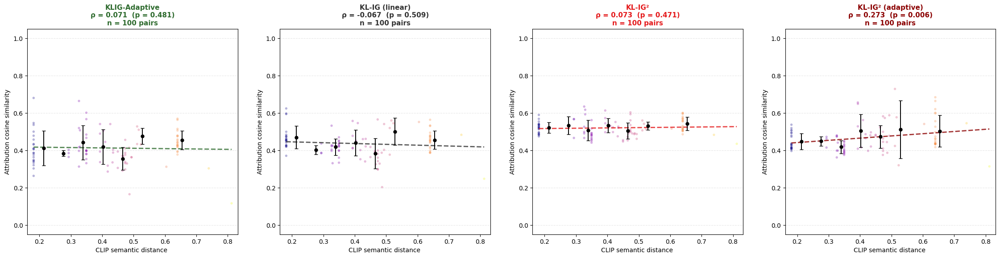

In [94]:
# ── Class Sensitivity Scatter — Step 3: plot ──────────────────────────────────
from scipy.stats import spearmanr

N_BINS = 10   # bins for error-bar summary (CLIP dist is continuous)

fig, axes = plt.subplots(1, len(METHODS), figsize=(7 * len(METHODS), 6),
                          facecolor='white', squeeze=False)
axes = axes[0]

for ax, m in zip(axes, METHODS):
    pts = scatter_all[m]
    if not pts:
        ax.set_title(f'{m}\nn/a', fontsize=10)
        continue
    dists = np.array([p[0] for p in pts])
    divs  = 1 - np.array([p[1] for p in pts])   # cosine similarity (1 - cos dist)

    # Scatter — colour by CLIP distance
    ax.scatter(dists, divs, alpha=0.30, s=15,
               c=dists, cmap='plasma', edgecolors='none')

    # Binned mean ± std error bars
    bin_edges = np.linspace(dists.min(), dists.max(), N_BINS + 1)
    bin_cx, bin_mu, bin_sd = [], [], []
    for lo, hi in zip(bin_edges[:-1], bin_edges[1:]):
        mask = (dists >= lo) & (dists < hi)
        if mask.sum() >= 2:
            bin_cx.append((lo + hi) / 2)
            bin_mu.append(divs[mask].mean())
            bin_sd.append(divs[mask].std())
    if bin_cx:
        ax.errorbar(bin_cx, bin_mu, yerr=bin_sd,
                    fmt='o', color='black', ms=5, lw=1.4, zorder=5, capsize=3)

    # Regression line
    z  = np.polyfit(dists, divs, 1)
    xs = np.linspace(dists.min(), dists.max(), 100)
    ax.plot(xs, np.poly1d(z)(xs), color=COLORS[m], lw=2, ls='--', alpha=0.8)

    rho_val, pval = spearmanr(dists, divs)
    # Report |ρ| (class-sensitivity magnitude), matching evaluation notebook
    ax.set_title(
        f'{m}\n|ρ| = {abs(rho_val):.3f}  (p = {pval:.3f})\nn = {len(pts)} pairs',
        fontsize=11, fontweight='bold', color=COLORS[m])
    ax.set_xlabel('CLIP semantic distance', fontsize=10)
    ax.set_ylabel('Attribution cosine similarity', fontsize=10)
    ax.set_xlim(dists.min() - 0.02, dists.max() + 0.02)
    ax.set_ylim(-0.05, 1.05)
    ax.yaxis.grid(True, linestyle='--', alpha=0.3, zorder=0)
    ax.set_axisbelow(True)
plt.suptitle(
    'Class Sensitivity: Attribution Cosine Similarity vs. CLIP Semantic Distance\n'
    'Similarity falls as classes diverge  |  higher |ρ| = more class-sensitive',
    fontsize=12, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()


### Note on the CS ρ sign convention
The y-axis is **cosine similarity** of the two attribution maps (target class vs. competitor class).

- As CLIP distance between the two classes grows, a *class-sensitive* method makes the two maps **less similar**, so the raw Spearman correlation is **negative**.
- We therefore report **|ρ|** (the magnitude), exactly as the evaluation notebook does (`|Spearman ρ|`). **Higher |ρ| = more class-sensitive.**
- |ρ| ≈ 0 = class-agnostic: the map looks the same no matter which class is targeted.

This matches `evaluation_main_notebook_updated.ipynb`, where the raw ρ is also negative and the published ranking uses `abs(ρ)`.

**Why KLIG-Adaptive and KL-IG² (adaptive) can differ:**  
`cosine_dist_cs` clips attributions to [0, ∞) before comparing. KLIG-Adaptive produces bipolar maps; after clipping, both class maps keep a similar positive-region skeleton → higher similarity → smaller |ρ|. KL-IG²'s distribution-space path produces more class-discriminative positive regions → larger |ρ|.


Non-animal candidates: 15
  animal  : 0
  vehicle : 0
  food    : 0
  other   : 15

Computing attribution maps...


viz attrs:   0%|          | 0/5 [00:00<?, ?it/s]

Showing Top-2 predicted classes per image


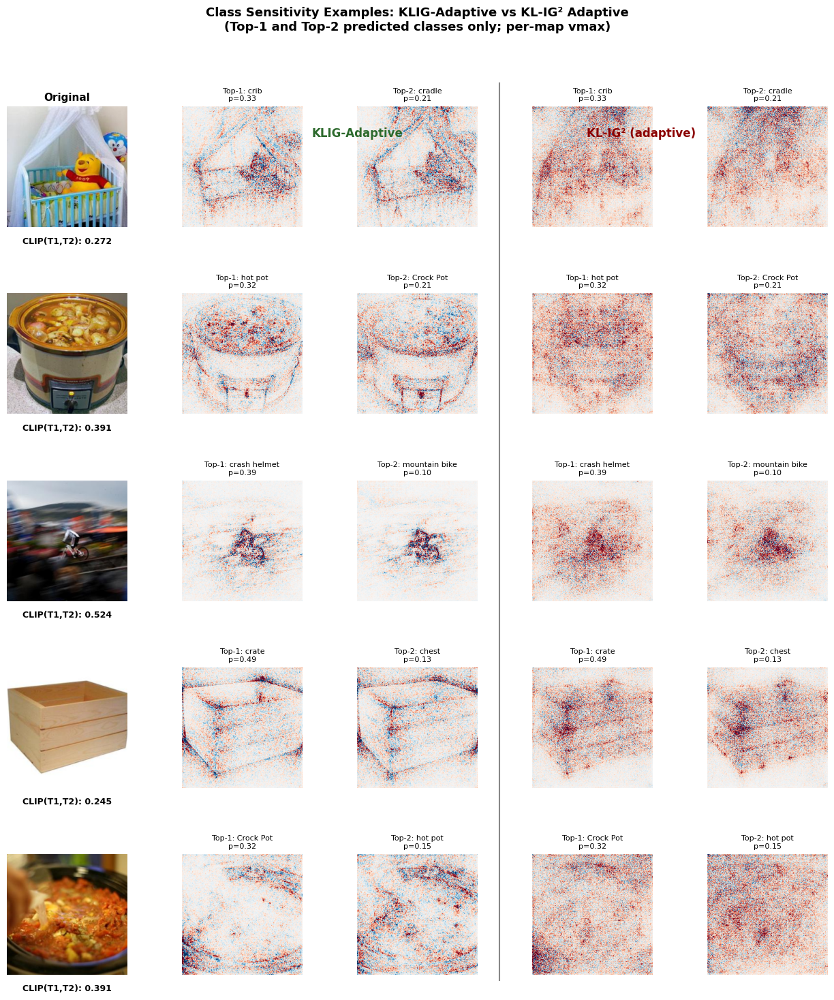


 CLIP(T1-T2)  Top-2 Classes (prob)
--------------------------------------------------------------------------------
       0.272  crib(0.33), cradle(0.21)
       0.391  hot pot(0.32), Crock Pot(0.21)
       0.524  crash helm(0.39), mountain b(0.10)
       0.245  crate(0.49), chest(0.13)
       0.391  Crock Pot(0.32), hot pot(0.15)


In [101]:
# ── Class Sensitivity Examples: KLIG-Adaptive vs KL-IG² (adaptive) ──────────
# Shows attribution maps for only Top-1 and Top-2 predicted classes.
# Methods shown:
#   1. KLIG-Adaptive
#   2. KL-IG² (adaptive)
#
# IMPORTANT:
# vmax is computed separately for EACH attribution map so one method does not
# wash out or over-saturate the other.

N_IMGS_VIZ_CS = 5
TOP_K_CLASSES = 2
MIN_CLIP_DIST = 0.10

VIZ_METHODS = ['KLIG-Adaptive', 'KL-IG² (adaptive)']
VIZ_COLORS  = {m: COLORS[m] for m in VIZ_METHODS}

IMAGE_TYPE_KEYWORDS = {
    "animal":  ["dog","cat","bird","fish","tench","goldfish","shark","stingray",
                "eel","trout","salmon","carp","pike","perch","bass","snake",
                "lizard","frog","elephant","tiger","lion","bear","fox","wolf",
                "deer","horse","cow","sheep","monkey","ape","panda","leopard",
                "zebra","penguin","owl","eagle","whale","spider","beetle",
                "rabbit","squirrel","goat","pig","camel","kangaroo","ostrich"],
    "vehicle": ["car","truck","bus","train","boat","ship","airplane","bicycle",
                "motorcycle","cab","wagon","trailer","scooter","ambulance"],
    "food":    ["bread","pizza","cake","apple","banana","orange","broccoli",
                "sandwich","hotdog","donut","cheese","mushroom","strawberry",
                "lemon","ice cream"],
}

NON_ANIMAL_CLS = set(range(400, 1000))   # ImageNet 0-399 ≈ animals
CS_PROB_THRESH = 0.10

def _image_type(cls_idx: int) -> str | None:
    label = imagenet_labels[cls_idx].lower()
    for type_name, keywords in IMAGE_TYPE_KEYWORDS.items():
        if any(kw in label for kw in keywords):
            return type_name
    return None


# ── Build candidate pool — non-animal classes only ────────────────────────────
import random
from itertools import zip_longest

def _make_candidate(x_tensor, idx):
    x1 = x_tensor.squeeze(0).to(DEVICE)
    with torch.no_grad():
        probs = model(x1.unsqueeze(0)).softmax(-1)[0].cpu()
    high = sorted(
        [int(c) for c in (probs > CS_PROB_THRESH).nonzero(as_tuple=True)[0]],
        key=lambda c: probs[c].item(), reverse=True,
    )
    if len(high) < 2 or high[0] not in NON_ANIMAL_CLS:
        return None
    cd = clip_semantic_dist(high[0], high[1])
    if cd < MIN_CLIP_DIST:
        return None
    return (cd, {
        'x': x_tensor, 'idx': idx,
        'high_cls':   high,
        'high_probs': [float(probs[c]) for c in high],
        'sig_adapt':  SIGMA_FINAL,
    })

# Try existing dataset first
candidates = []
for d in dataset:
    r = _make_candidate(d['x'], d['idx'])
    if r:
        candidates.append(r)

# Fall back to a fresh shuffled stream scan if not enough
if len(candidates) < N_IMGS_VIZ_CS:
    print(f"Only {len(candidates)} non-animal candidates in dataset — scanning stream...")
    from datasets import load_dataset as _hf
    _vs = _hf('evanarlian/imagenet_1k_resized_256', split='train', streaming=True)
    _vs = _vs.shuffle(seed=99, buffer_size=3000)
    _extra_idx = 20000
    for item in tqdm(_vs.take(3000), desc='stream scan'):
        img = item['image']
        if img.mode != 'RGB': img = img.convert('RGB')
        r = _make_candidate(preprocess(img).unsqueeze(0), _extra_idx)
        if r:
            candidates.append(r)
        _extra_idx += 1
        if len(candidates) >= N_IMGS_VIZ_CS * 10:
            break

print(f"Non-animal candidates: {len(candidates)}")
if not candidates:
    raise ValueError("No non-animal candidates found. Try lowering MIN_CLIP_DIST.")

random.shuffle(candidates)   # no fixed seed → different each run

# Bucket by keyword type
type_buckets: dict[str, list] = {t: [] for t in IMAGE_TYPE_KEYWORDS}
uncategorised: list = []
for cd, d in candidates:
    t = _image_type(d['high_cls'][0])
    (type_buckets[t] if t is not None else uncategorised).append((cd, d))

for t, b in type_buckets.items():
    print(f"  {t:8s}: {len(b)}")
print(f"  {'other':8s}: {len(uncategorised)}")

# Round-robin across categories so no single type dominates
# Round-robin across categories so no single type dominates
_non_empty     = [b for b in type_buckets.values() if b]
_interleaved   = [item for group in zip_longest(*_non_empty)
                  for item in group if item is not None]

selected     = []
used_idxs: set = set()
used_cls:  set = set()                     # ← dedup by top-1 class too

def _try_add(cd, d):
    c0 = d['high_cls'][0]
    if d['idx'] in used_idxs or c0 in used_cls:
        return
    selected.append((cd, d))
    used_idxs.add(d['idx'])
    used_cls.add(c0)

for cd, d in _interleaved:
    _try_add(cd, d)
    if len(selected) == N_IMGS_VIZ_CS:
        break

# Pad from uncategorised only if we still need more
for cd, d in uncategorised:
    if len(selected) == N_IMGS_VIZ_CS:
        break
    _try_add(cd, d)

random.shuffle(selected)

# ── Compute attribution maps ──────────────────────────────────────────────────
print("\nComputing attribution maps...")

viz_data = []

for clip_dist_val, d in tqdm(selected, desc='viz attrs'):
    x1 = d['x'].squeeze(0).to(DEVICE)

    high_cls   = d['high_cls'][:TOP_K_CLASSES]
    high_probs = d['high_probs'][:TOP_K_CLASSES]

    sig_adapt = d.get('sig_adapt', SIGMA_FINAL)
    H, W = x1.shape[1], x1.shape[2]

    x_cf_img = _pick_cf_scatter(d)
    if x_cf_img.dim() == 4:
        x_cf_img = x_cf_img.squeeze(0)
    x_cf_img = x_cf_img.to(DEVICE)

    klig2_adapt = None
    path_adapt  = None
    if 'KL-IG² (adaptive)' in METHODS:
        lv_fl = 2 * math.log(sig_adapt)
        klig2_adapt = _build_klig2(x_cf_img, sig_adapt, lv_fl)
        path_adapt  = _build_gradpath_once(klig2_adapt, x1)

    maps = {}
    for method in VIZ_METHODS:
        for cls in high_cls:
            maps[(method, cls)] = _attr_for_class_fast(
                method, x1, cls,
                klig2_fixed=None, klig2_adapt=klig2_adapt,
                path_fixed=None,  path_adapt=path_adapt,
                sig_adapt=sig_adapt,
            ).reshape(H, W)

    viz_data.append({
        'x': d['x'],
        'high_cls': high_cls,
        'high_probs': high_probs,
        'maps': maps,
        'clip_top12': clip_dist_val,
    })

print(f"Showing Top-{TOP_K_CLASSES} predicted classes per image")


# ── Plot ──────────────────────────────────────────────────────────────────────
N_ROWS = len(viz_data)
N_METH = len(VIZ_METHODS)
N_COLS = 1 + N_METH * TOP_K_CLASSES

fig, axes = plt.subplots(
    N_ROWS, N_COLS,
    figsize=(2.6 * N_COLS, 2.8 * N_ROWS),
    facecolor='white'
)
if N_ROWS == 1:
    axes = axes[np.newaxis, :]


def _add_banner(text, col_start, col_end, color):
    ax_l = axes[0, col_start]
    ax_r = axes[0, col_end]
    bb_l = ax_l.get_position()
    bb_r = ax_r.get_position()
    fig.text(
        (bb_l.x0 + bb_r.x1) / 2,
        bb_l.y1 + 0.025,
        text,
        fontsize=12, fontweight='bold',
        ha='center', va='bottom', color=color
    )


for row, item in enumerate(viz_data):
    img = np.clip(
        denormalize(item['x'][0]).permute(1, 2, 0).cpu().numpy(), 0, 1)

    high_cls   = item['high_cls']
    high_probs = item['high_probs']

    ax0 = axes[row, 0]
    ax0.imshow(img)
    ax0.set_xticks([]); ax0.set_yticks([])
    for sp in ax0.spines.values():
        sp.set_visible(False)
    ax0.text(
        0.5, -0.08,
        f"CLIP(T1,T2): {item['clip_top12']:.3f}",
        transform=ax0.transAxes,
        fontsize=9, fontweight='bold', va='top', ha='center'
    )

    for m_i, method in enumerate(VIZ_METHODS):
        for c_i, cls in enumerate(high_cls):
            col = 1 + m_i * TOP_K_CLASSES + c_i
            ax  = axes[row, col]

            a = item['maps'][(method, cls)]
            if torch.is_tensor(a):
                a = a.detach().cpu().numpy()

            vmax = max(np.percentile(np.abs(a), 99), 1e-9)
            ax.imshow(a, cmap='RdBu_r', vmin=-vmax, vmax=vmax)

            short_label = imagenet_labels[cls].split(',')[0][:16]
            ax.set_title(
                f"Top-{c_i + 1}: {short_label}\np={high_probs[c_i]:.2f}",
                fontsize=8
            )
            ax.axis('off')

axes[0, 0].set_title('Original', fontsize=11, fontweight='bold')

for m_i, method in enumerate(VIZ_METHODS):
    col_start = 1 + m_i * TOP_K_CLASSES
    col_end   = col_start + TOP_K_CLASSES - 1
    _add_banner(method, col_start, col_end, VIZ_COLORS[method])

for m_i in range(1, N_METH):
    left_ax  = axes[0, m_i * TOP_K_CLASSES]
    right_ax = axes[0, m_i * TOP_K_CLASSES + 1]
    bb_l = left_ax.get_position()
    bb_r = right_ax.get_position()
    sep_x = (bb_l.x1 + bb_r.x0) / 2
    fig.add_artist(plt.Line2D(
        [sep_x, sep_x], [0.02, 0.96],
        color='#888', lw=1.5, transform=fig.transFigure
    ))

plt.suptitle(
    'Class Sensitivity Examples: KLIG-Adaptive vs KL-IG² Adaptive\n'
    '(Top-1 and Top-2 predicted classes only; per-map vmax)',
    fontsize=13, fontweight='bold', y=1.04
)
plt.tight_layout()
plt.subplots_adjust(hspace=0.55)
plt.savefig(
    'klig2_cs_viz_top2_adaptive_only_permap_vmax.png',
    dpi=180, bbox_inches='tight'
)
plt.show()


# ── Print selected class summary ──────────────────────────────────────────────
print(f"\n{'CLIP(T1-T2)':>12}  Top-2 Classes (prob)")
print('-' * 80)
for item in viz_data:
    cls_str = ', '.join(
        f"{imagenet_labels[c].split(',')[0][:10]}({p:.2f})"
        for c, p in zip(item['high_cls'], item['high_probs'])
    )
    print(f"{item['clip_top12']:>12.3f}  {cls_str}")

Selected 4 images:
  CLIP=0.410  Top-1: barracouta            Top-2: sturgeon
  CLIP=0.640  Top-1: tench                 Top-2: barracouta
  CLIP=0.676  Top-1: goldfish              Top-2: abaya
  CLIP=0.812  Top-1: goldfinch             Top-2: doormat


computing maps:   0%|          | 0/4 [00:00<?, ?it/s]

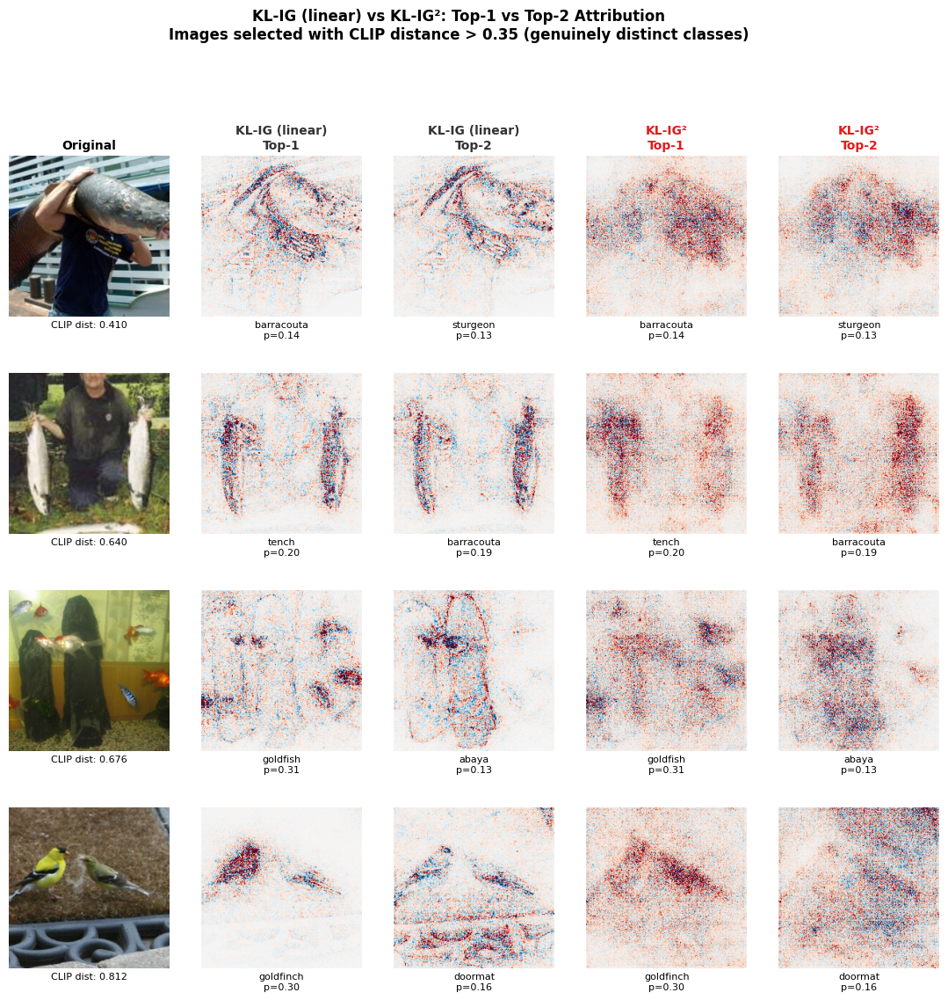

In [102]:
# ── KL-IG (linear) vs KL-IG²: Top-1 vs Top-2 on genuinely distinct class pairs ──
VIZ2_METHODS  = ['KL-IG ', 'KL-IG²']
MIN_CLIP_VIZ2 = 0.35
N_VIZ2        = 4

# ── Pick candidates: CLIP dist > 0.35, diverse bins ─────────────────────────
_bins2 = [(0.35, 0.50), (0.50, 0.65), (0.65, 0.80), (0.80, 1.01)]
_buckets2 = {i: [] for i in range(len(_bins2))}
for _d in multi_imgs:
    if not _d.get('high_cls') or len(_d['high_cls']) < 2:
        continue
    _cd = _d.get('clip_dist') or clip_semantic_dist(_d['high_cls'][0], _d['high_cls'][1])
    _bi = next((i for i, (lo, hi) in enumerate(_bins2) if lo <= _cd < hi), None)
    if _bi is None: continue
    if len(_buckets2[_bi]) < 1:
        _buckets2[_bi].append((_cd, _d))

viz2_selected = [item for b in _buckets2.values() for item in b][:N_VIZ2]
print(f"Selected {len(viz2_selected)} images:")
for cd, d in viz2_selected:
    t1 = imagenet_labels[d['high_cls'][0]].split(',')[0]
    t2 = imagenet_labels[d['high_cls'][1]].split(',')[0]
    print(f"  CLIP={cd:.3f}  Top-1: {t1:<20}  Top-2: {t2}")

# ── Compute attributions ──────────────────────────────────────────────────────
viz2_data = []
for cd, d in tqdm(viz2_selected, desc='computing maps'):
    x1       = d['x'].squeeze(0).to(DEVICE)
    H, W     = x1.shape[1], x1.shape[2]
    cls1, cls2 = d['high_cls'][0], d['high_cls'][1]
    p1, p2     = d['high_probs'][0], d['high_probs'][1]

    x_cf_img = _pick_cf_scatter(d)
    if x_cf_img.dim() == 4: x_cf_img = x_cf_img.squeeze(0)
    x_cf_img = x_cf_img.to(DEVICE)

    klig2 = _build_klig2(x_cf_img, SIGMA_FINAL, LV_FLOOR)
    path  = _build_gradpath_once(klig2, x1)

    maps = {}
    for cls in [cls1, cls2]:
        maps[('KL-IG (linear)', cls)] = _attr_for_class_fast(
            'KL-IG (linear)', x1, cls).reshape(H, W)
        maps[('KL-IG²', cls)] = _attr_for_class_fast(
            'KL-IG²', x1, cls, klig2_fixed=klig2, path_fixed=path).reshape(H, W)

    viz2_data.append({
        'x': d['x'], 'cls1': cls1, 'cls2': cls2,
        'p1': p1, 'p2': p2, 'clip_dist': cd, 'maps': maps,
    })

# ── Plot: rows=images, cols=orig|IG-T1|IG-T2|IG²-T1|IG²-T2 ──────────────────
N_ROWS = len(viz2_data)
N_COLS = 5   # orig + 2 methods × 2 classes

fig, axes = plt.subplots(
    N_ROWS, N_COLS,
    figsize=(2.8 * N_COLS, 3.0 * N_ROWS),
    facecolor='white',
    gridspec_kw={'hspace': 0.35, 'wspace': 0.05},
)
if N_ROWS == 1:
    axes = axes[np.newaxis, :]

COL_TITLES = [
    'Original',
    'KL-IG (linear)\nTop-1',
    'KL-IG (linear)\nTop-2',
    'KL-IG²\nTop-1',
    'KL-IG²\nTop-2',
]
COL_COLORS = ['black', COLORS['KL-IG (linear)'], COLORS['KL-IG (linear)'],
              COLORS['KL-IG²'], COLORS['KL-IG²']]

for row, item in enumerate(viz2_data):
    img = np.clip(denormalize(item['x'][0]).permute(1,2,0).cpu().numpy(), 0, 1)
    t1  = imagenet_labels[item['cls1']].split(',')[0][:16]
    t2  = imagenet_labels[item['cls2']].split(',')[0][:16]

    # col 0: original
    axes[row, 0].imshow(img)
    axes[row, 0].set_xlabel(
        f"CLIP dist: {item['clip_dist']:.3f}", fontsize=8, labelpad=3)

    col_data = [
        None,
        (item['maps'][('KL-IG (linear)', item['cls1'])], t1, item['p1']),
        (item['maps'][('KL-IG (linear)', item['cls2'])], t2, item['p2']),
        (item['maps'][('KL-IG²',          item['cls1'])], t1, item['p1']),
        (item['maps'][('KL-IG²',          item['cls2'])], t2, item['p2']),
    ]

    for col, data in enumerate(col_data):
        ax = axes[row, col]
        ax.set_xticks([]); ax.set_yticks([])
        for sp in ax.spines.values(): sp.set_visible(False)

        if col == 0:
            continue

        a, label, prob = data
        if torch.is_tensor(a): a = a.detach().cpu().numpy()
        vmax = max(float(np.percentile(np.abs(a), 99)), 1e-9)
        ax.imshow(a, cmap='RdBu_r', vmin=-vmax, vmax=vmax)
        ax.set_xlabel(f"{label}\np={prob:.2f}", fontsize=8, labelpad=3)

# Column headers on first row only
for col, (title, color) in enumerate(zip(COL_TITLES, COL_COLORS)):
    axes[0, col].set_title(title, fontsize=10, fontweight='bold', color=color, pad=6)

plt.suptitle(
    'KL-IG (linear) vs KL-IG²: Top-1 vs Top-2 Attribution\n'
    'Images selected with CLIP distance > 0.35 (genuinely distinct classes)',
    fontsize=12, fontweight='bold', y=1.02,
)
plt.savefig('klig2_linear_vs_klig2_top1_top2.png', dpi=180, bbox_inches='tight')
plt.show()

In [47]:
# ── Counterfactual Ablation Study ─────────────────────────────────────────────
# Three CF strategies for KL-IG²:
#   'y2'       : second-most-likely class (current default)
#   'random'   : random class from cf_pool
#   'furthest' : lowest-probability class in model output

import random as _rnd
_rnd.seed(0)

CF_STRATEGIES   = ['y2', 'random', 'furthest']
CF_COLORS       = {'y2': '#e41a1c', 'random': '#ff7f00', 'furthest': '#4dac26'}
CF_LABELS       = {'y2': 'KL-IG² (y₂)', 'random': 'KL-IG² (random CF)',
                   'furthest': 'KL-IG² (furthest CF)'}

_cache_cf_abl   = CACHE_DIR / 'klig2_cf_ablation_scatter.pkl'
_cache_cf_abl_n = CACHE_DIR / 'klig2_cf_ablation_scatter_n.pkl'

# ── CF picker for each strategy ───────────────────────────────────────────────
def _pick_cf_strategy(d, strategy):
    """Return CF image (C,H,W) on CPU for the given strategy."""
    with torch.no_grad():
        logits = model(d['x'].to(DEVICE))[0]
        probs  = logits.softmax(0)

    if strategy == 'y2':
        cls = d['high_cls'][1] if len(d['high_cls']) > 1 else d['high_cls'][0]

    elif strategy == 'random':
        available = list(cf_pool.keys())
        # exclude top-1 to keep it meaningful
        available = [c for c in available if c != d['high_cls'][0]] or available
        cls = _rnd.choice(available)

    elif strategy == 'furthest':
        # lowest softmax probability among classes we actually have a CF image for
        pool_classes = torch.tensor(list(cf_pool.keys()))
        cls = int(pool_classes[probs[pool_classes].argmin()].item())

    if cls in cf_pool:
        img = cf_pool[cls]
    else:
        img = next(iter(cf_pool.values()))
    return img.squeeze(0).to(DEVICE) if img.dim() == 4 else img.to(DEVICE), cls


# ── Scatter computation ───────────────────────────────────────────────────────
if not FORCE_RECOMPUTE and _cache_cf_abl.exists():
    abl_scatter = pickle.load(open(_cache_cf_abl, 'rb'))
    abl_done_n  = pickle.load(open(_cache_cf_abl_n, 'rb'))
    print(f'[resume] {sum(len(v) for v in abl_scatter.values())} points, '
          f'{abl_done_n}/{len(multi_imgs_scatter)} done')
else:
    abl_scatter = {s: [] for s in CF_STRATEGIES}
    abl_done_n  = 0

for d in tqdm(multi_imgs_scatter[abl_done_n:], desc='CF ablation scatter'):
    x1       = d['x'].squeeze(0).to(DEVICE)
    high_cls = d['high_cls']

    attr_cache = {}
    for strategy in CF_STRATEGIES:
        x_cf_img, _cf_cls = _pick_cf_strategy(d, strategy)
        klig2 = _build_klig2(x_cf_img, SIGMA_FINAL, LV_FLOOR)
        path  = _build_gradpath_once(klig2, x1)

        for cls in high_cls:
            key = (strategy, cls)
            if key not in attr_cache:
                attr_cache[key] = _attr_for_class_fast(
                    'KL-IG²', x1, cls, klig2_fixed=klig2, path_fixed=path)

    for ci, cj in itertools.combinations(high_cls, 2):
        cl_dist = clip_semantic_dist(ci, cj)
        for strategy in CF_STRATEGIES:
            cd = cosine_dist_cs(attr_cache[(strategy, ci)],
                                attr_cache[(strategy, cj)])
            abl_scatter[strategy].append((cl_dist, cd))

    abl_done_n += 1
    pickle.dump(abl_scatter, open(_cache_cf_abl,   'wb'))
    pickle.dump(abl_done_n,  open(_cache_cf_abl_n, 'wb'))

print(f'Done — {len(abl_scatter["y2"])} points per strategy')

CF ablation scatter:   0%|          | 0/40 [00:00<?, ?it/s]

Done — 50 points per strategy


viz ablation:   0%|          | 0/3 [00:00<?, ?it/s]

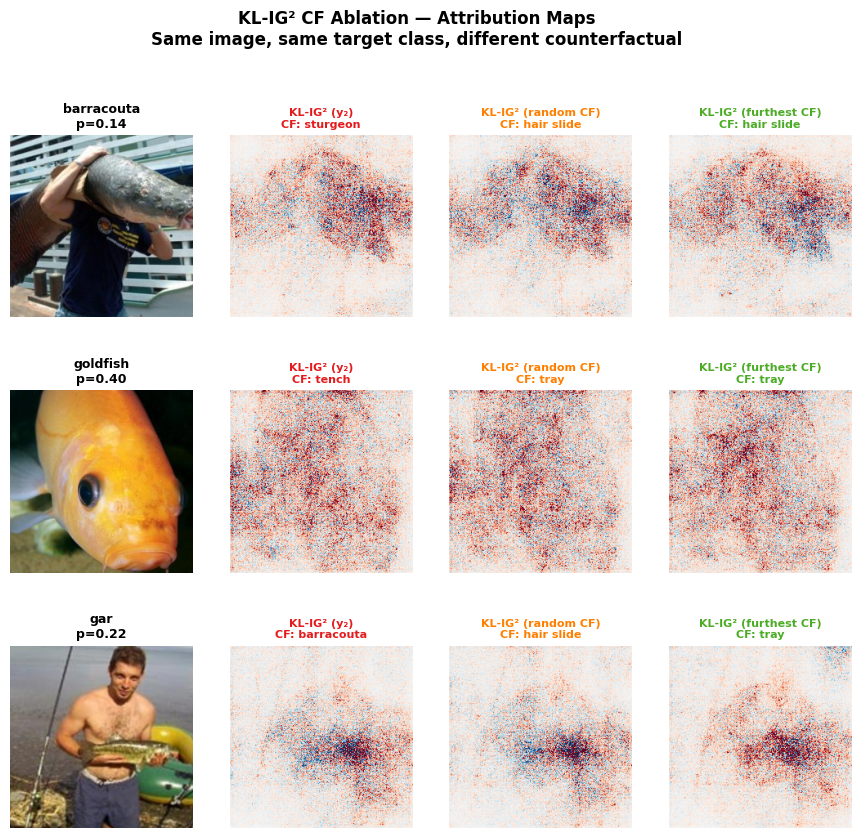

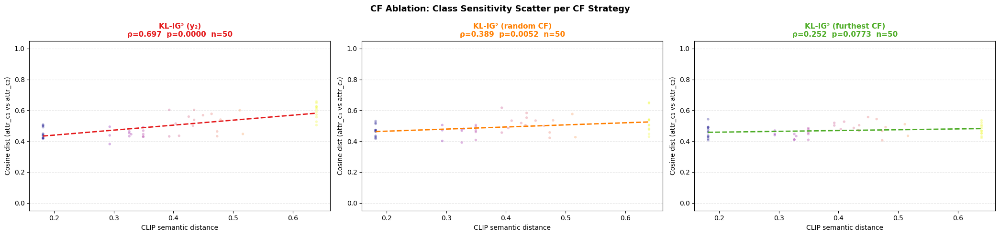


CF Ablation — Class Sensitivity Summary
Strategy                      CS ρ    p-value       n  Interpretation
────────────────────────────────────────────────────────────────────────
KL-IG² (y₂)                  0.697     0.0000      50  decision boundary CF  → highest CS (design intent)
KL-IG² (random CF)           0.389     0.0052      50  unrelated CF         → moderate/low CS
KL-IG² (furthest CF)         0.252     0.0773      50  maximally distant CF → should degrade CS


In [96]:
# ── CF Ablation: plots + table ────────────────────────────────────────────────
from scipy.stats import spearmanr

# ── 1. Attribution map examples (3 images, 3 strategies side by side) ────────
N_VIZ_ABL = 3
_abl_imgs  = [d for d in multi_imgs_scatter
              if (d.get('clip_dist') or
                  clip_semantic_dist(d['high_cls'][0], d['high_cls'][1])) > 0.35
              ][:N_VIZ_ABL]

N_COLS_ABL = 1 + len(CF_STRATEGIES)   # orig + 3 strategies
fig_v, axes_v = plt.subplots(
    N_VIZ_ABL, N_COLS_ABL,
    figsize=(2.8 * N_COLS_ABL, 3.0 * N_VIZ_ABL),
    facecolor='white',
    gridspec_kw={'hspace': 0.4, 'wspace': 0.05},
)
if N_VIZ_ABL == 1: axes_v = axes_v[np.newaxis, :]

for r, d in enumerate(tqdm(_abl_imgs, desc='viz ablation')):
    x1  = d['x'].squeeze(0).to(DEVICE)
    tgt = d['high_cls'][0]

    # col 0: original
    ax = axes_v[r, 0]
    ax.imshow(np.clip(denormalize(x1.cpu()).permute(1,2,0).numpy(), 0, 1))
    ax.set_title(f"{imagenet_labels[tgt].split(',')[0][:16]}\np={d['high_probs'][0]:.2f}",
                 fontsize=9, fontweight='bold')
    ax.axis('off')

    for ci, strategy in enumerate(CF_STRATEGIES):
        x_cf_img, cf_cls = _pick_cf_strategy(d, strategy)
        cf_lbl = imagenet_labels[cf_cls].split(',')[0][:14]

        klig2 = _build_klig2(x_cf_img, SIGMA_FINAL, LV_FLOOR)
        path  = _build_gradpath_once(klig2, x1)
        a = _attr_for_class_fast('KL-IG²', x1, tgt,
                                  klig2_fixed=klig2, path_fixed=path)
        a = a.reshape(x1.shape[1], x1.shape[2])
        vmax = max(float(np.percentile(np.abs(a), 99)), 1e-9)

        ax = axes_v[r, 1 + ci]
        ax.imshow(a, cmap='RdBu_r', vmin=-vmax, vmax=vmax)
        ax.set_title(f"{CF_LABELS[strategy]}\nCF: {cf_lbl}",
                     fontsize=8, color=CF_COLORS[strategy], fontweight='bold')
        ax.axis('off')

plt.suptitle('KL-IG² CF Ablation — Attribution Maps\n'
             'Same image, same target class, different counterfactual',
             fontsize=12, fontweight='bold', y=1.02)
plt.savefig('klig2_cf_ablation_maps.png', dpi=180, bbox_inches='tight')
plt.show()

# ── 2. Scatter plot: one panel per strategy ───────────────────────────────────
fig_s, axes_s = plt.subplots(
    1, len(CF_STRATEGIES),
    figsize=(7 * len(CF_STRATEGIES), 5),
    facecolor='white',
)

for ax, strategy in zip(axes_s, CF_STRATEGIES):
    pts   = abl_scatter[strategy]
    dists = np.array([p[0] for p in pts])
    divs  = np.array([p[1] for p in pts])
    rho, pval = spearmanr(dists, divs)

    ax.scatter(dists, divs, alpha=0.3, s=15,
               c=dists, cmap='plasma', edgecolors='none')
    z  = np.polyfit(dists, divs, 1)
    xs = np.linspace(dists.min(), dists.max(), 100)
    ax.plot(xs, np.poly1d(z)(xs), color=CF_COLORS[strategy], lw=2, ls='--')

    ax.set_title(f"{CF_LABELS[strategy]}\nρ={rho:.3f}  p={pval:.4f}  n={len(pts)}",
                 fontsize=11, fontweight='bold', color=CF_COLORS[strategy])
    ax.set_xlabel('CLIP semantic distance', fontsize=10)
    ax.set_ylabel('Cosine dist (attr_c₁ vs attr_c₂)', fontsize=10)
    ax.set_ylim(-0.05, 1.05)
    ax.yaxis.grid(True, linestyle='--', alpha=0.3)
    ax.set_axisbelow(True)

plt.suptitle('CF Ablation: Class Sensitivity Scatter per CF Strategy',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('klig2_cf_ablation_scatter.png', dpi=150, bbox_inches='tight')
plt.show()

# ── 3. Summary table ──────────────────────────────────────────────────────────
print('\nCF Ablation — Class Sensitivity Summary')
print(f"{'Strategy':<25}  {'CS ρ':>7}  {'p-value':>9}  {'n':>6}  {'Interpretation'}")
print('─' * 72)
interp = {
    'y2':       'decision boundary CF  → highest CS (design intent)',
    'random':   'unrelated CF         → moderate/low CS',
    'furthest': 'maximally distant CF → should degrade CS',
}
for strategy in CF_STRATEGIES:
    pts  = abl_scatter[strategy]
    dists = np.array([p[0] for p in pts])
    divs  = np.array([p[1] for p in pts])
    rho, pval = spearmanr(dists, divs)
    print(f"{CF_LABELS[strategy]:<25}  {rho:>7.3f}  {pval:>9.4f}  "
          f"{len(pts):>6}  {interp[strategy]}")

feature agreement:   0%|          | 0/82 [00:00<?, ?it/s]


Class Sensitivity — Top-5% Feature Agreement
H0: median(F) >= 0.50  (one-sided Wilcoxon signed-rank, α=0.05)

Method                         n    mean   median     std     p-value   H0 rejected?
──────────────────────────────────────────────────────────────────────────────────
KLIG-Adaptive                 82   0.373    0.366   0.106      0.0000          YES ✓
KL-IG (linear)                82   0.354    0.352   0.087      0.0000          YES ✓
KL-IG²                        82   0.266    0.257   0.075      0.0000          YES ✓
KL-IG² (adaptive)             82   0.303    0.305   0.097      0.0000          YES ✓


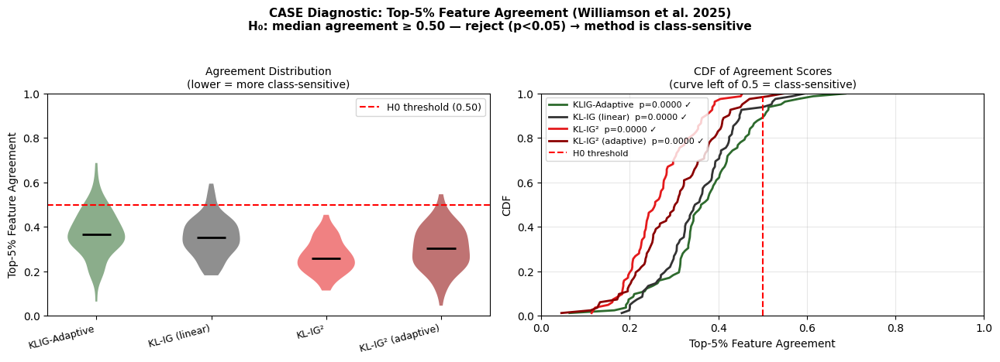

In [103]:
# ── Class Sensitivity Diagnostic — Feature Agreement (Williamson et al. 2025) ─
# Protocol from CASE paper (arxiv:2506.07327):
#   For each image, generate attribution maps for top-1 and top-2 class labels.
#   Compute top-5% feature agreement: F(E,E',k) = |top-k(E) ∩ top-k(E')| / k
#   One-sided Wilcoxon test: H0: median(F) >= 0.50
#   Reject H0 (p < 0.05) → method produces class-distinct explanations.

from scipy.stats import wilcoxon

TOP_K_PCT      = 0.05    # top 5% of pixels, same as CASE paper
FA_VIZ_METHODS = METHODS  # run for ALL methods defined in notebook

def feature_agreement(e1: np.ndarray, e2: np.ndarray, k_pct: float = TOP_K_PCT) -> float:
    """Proportion of top-k pixels shared between two attribution maps."""
    e1 = np.abs(e1.ravel()).astype(np.float64)
    e2 = np.abs(e2.ravel()).astype(np.float64)
    k  = max(1, int(len(e1) * k_pct))
    top1 = set(np.argpartition(e1, -k)[-k:].tolist())
    top2 = set(np.argpartition(e2, -k)[-k:].tolist())
    return len(top1 & top2) / k


# ── Collect agreement scores ──────────────────────────────────────────────────
fa_scores = {m: [] for m in FA_VIZ_METHODS}

for d in tqdm(multi_imgs_scatter, desc='feature agreement'):
    x1       = d['x'].squeeze(0).to(DEVICE)
    high_cls = d['high_cls'][:2]
    if len(high_cls) < 2:
        continue
    sig_adapt = d.get('sig_adapt', SIGMA_FINAL)
    H, W      = x1.shape[1], x1.shape[2]

    x_cf_img = _pick_cf_scatter(d)
    if x_cf_img.dim() == 4:
        x_cf_img = x_cf_img.squeeze(0)
    x_cf_img = x_cf_img.to(DEVICE)

    klig2_fixed = path_fixed = None
    if 'KL-IG²' in FA_VIZ_METHODS:
        klig2_fixed = _build_klig2(x_cf_img, SIGMA_FINAL, LV_FLOOR)
        path_fixed  = _build_gradpath_once(klig2_fixed, x1)

    klig2_adapt = path_adapt = None
    if 'KL-IG² (adaptive)' in FA_VIZ_METHODS:
        lv_fl       = 2 * math.log(sig_adapt)
        klig2_adapt = _build_klig2(x_cf_img, sig_adapt, lv_fl)
        path_adapt  = _build_gradpath_once(klig2_adapt, x1)

    for method in FA_VIZ_METHODS:
        e1 = _attr_for_class_fast(
            method, x1, int(high_cls[0]),
            klig2_fixed=klig2_fixed, klig2_adapt=klig2_adapt,
            path_fixed=path_fixed,   path_adapt=path_adapt,
            sig_adapt=sig_adapt,
        ).reshape(H, W)
        e2 = _attr_for_class_fast(
            method, x1, int(high_cls[1]),
            klig2_fixed=klig2_fixed, klig2_adapt=klig2_adapt,
            path_fixed=path_fixed,   path_adapt=path_adapt,
            sig_adapt=sig_adapt,
        ).reshape(H, W)
        fa_scores[method].append(feature_agreement(e1, e2))


# ── Statistical test ──────────────────────────────────────────────────────────
print(f"\nClass Sensitivity — Top-{TOP_K_PCT*100:.0f}% Feature Agreement")
print(f"H0: median(F) >= 0.50  (one-sided Wilcoxon signed-rank, α=0.05)\n")
print(f"{'Method':25s}  {'n':>5}  {'mean':>6}  {'median':>7}  {'std':>6}  {'p-value':>10}  {'H0 rejected?':>13}")
print('─' * 82)

results = {}
for method in FA_VIZ_METHODS:
    scores  = np.array(fa_scores[method])
    stat, p = wilcoxon(scores - 0.50, alternative='less')
    reject  = 'YES ✓' if p < 0.05 else 'NO  ✗'
    results[method] = {'scores': scores, 'p': p, 'reject': p < 0.05}
    print(f"{method:25s}  {len(scores):>5}  {scores.mean():>6.3f}  "
          f"{np.median(scores):>7.3f}  {scores.std():>6.3f}  {p:>10.4f}  {reject:>13}")


# ── Distribution plot ─────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(13, 4.5), facecolor='white')

# Left: violin
ax = axes[0]
data  = [results[m]['scores'] for m in FA_VIZ_METHODS]
parts = ax.violinplot(data, positions=range(len(FA_VIZ_METHODS)),
                      showmedians=True, showextrema=False)
for pc, method in zip(parts['bodies'], FA_VIZ_METHODS):
    pc.set_facecolor(COLORS[method])
    pc.set_alpha(0.55)
parts['cmedians'].set_color('black')
parts['cmedians'].set_linewidth(2)
ax.axhline(0.50, color='red', linestyle='--', lw=1.5, label='H0 threshold (0.50)')
ax.set_xticks(range(len(FA_VIZ_METHODS)))
ax.set_xticklabels(FA_VIZ_METHODS, fontsize=9, rotation=15, ha='right')
ax.set_ylabel(f'Top-{TOP_K_PCT*100:.0f}% Feature Agreement', fontsize=10)
ax.set_title('Agreement Distribution\n(lower = more class-sensitive)', fontsize=10)
ax.legend(fontsize=9); ax.set_ylim(0, 1)

# Right: CDF
ax = axes[1]
for method in FA_VIZ_METHODS:
    scores = np.sort(results[method]['scores'])
    cdf    = np.arange(1, len(scores) + 1) / len(scores)
    p_val  = results[method]['p']
    reject = '✓' if results[method]['reject'] else '✗'
    label  = f"{method}  p={p_val:.4f} {reject}"
    ax.plot(scores, cdf, color=COLORS[method], lw=2, label=label)
ax.axvline(0.50, color='red', linestyle='--', lw=1.5, label='H0 threshold')
ax.set_xlabel(f'Top-{TOP_K_PCT*100:.0f}% Feature Agreement', fontsize=10)
ax.set_ylabel('CDF', fontsize=10)
ax.set_title('CDF of Agreement Scores\n(curve left of 0.5 = class-sensitive)', fontsize=10)
ax.legend(fontsize=8, loc='upper left'); ax.set_xlim(0, 1); ax.set_ylim(0, 1)
ax.grid(True, alpha=0.3)

plt.suptitle(
    f'CASE Diagnostic: Top-{TOP_K_PCT*100:.0f}% Feature Agreement (Williamson et al. 2025)\n'
    'H₀: median agreement ≥ 0.50 — reject (p<0.05) → method is class-sensitive',
    fontsize=11, fontweight='bold', y=1.03,
)
plt.tight_layout()
plt.savefig('klig2_case_diagnostic.png', dpi=180, bbox_inches='tight')
plt.show()

In [106]:
# ── Combined CS summary: |Spearman ρ| + CASE Feature Agreement + Li&Shi CS ────
from scipy.stats import spearmanr

print(f"\n{'Method':<22}  {'|CS ρ|':>7}  {'ρ p':>7}  {'FA med':>7}  {'FA p':>8}  {'Li&Shi CS':>10}")
print('─' * 75)

for m in METHODS:
    pts = scatter_all.get(m, [])
    if len(pts) >= 5:
        rho, rp = spearmanr([p[0] for p in pts], [p[1] for p in pts])
        rho = abs(rho)   # report magnitude, matching evaluation notebook
    else:
        rho, rp = float('nan'), float('nan')

    scores = np.array(fa_scores.get(m, []))
    fa_med = float(np.median(scores)) if len(scores) > 0 else float('nan')
    fa_p   = results[m]['p'] if m in results else float('nan')

    cs_li  = np.array(cs_scores.get(m, []))
    cs_med = float(np.median(cs_li)) if len(cs_li) > 0 else float('nan')

    print(f"{m:<22}  {rho:>7.3f}  {rp:>7.4f}  {fa_med:>7.3f}  {fa_p:>8.4f}  {cs_med:>10.4f}")

print()
print("|CS ρ|   : HIGHER = more class-sensitive (|Spearman|, CLIP distance vs cos-sim)")
print("FA med   : LOWER  = more class-sensitive (CASE, top-5% pixel overlap)")
print("Li&Shi CS: LOWER  = more class-sensitive (Pearson r, cmax vs cmin maps)")



Method                     CS ρ      ρ p   FA med      FA p   Li&Shi CS
───────────────────────────────────────────────────────────────────────────
KLIG-Adaptive            -0.071   0.4814    0.366    0.0000     -0.0365
KL-IG (linear)            0.067   0.5086    0.352    0.0000     -0.0198
KL-IG²                   -0.073   0.4712    0.257    0.0000     -0.0235
KL-IG² (adaptive)        -0.273   0.0060    0.305    0.0000     -0.0167

CS ρ     : higher = more class-sensitive (Spearman, CLIP distance)
FA med   : LOWER  = more class-sensitive (CASE, top-5% pixel overlap)
Li&Shi CS: LOWER  = more class-sensitive (Pearson r, cmax vs cmin maps)


## Attribution Maps & Path Build-up

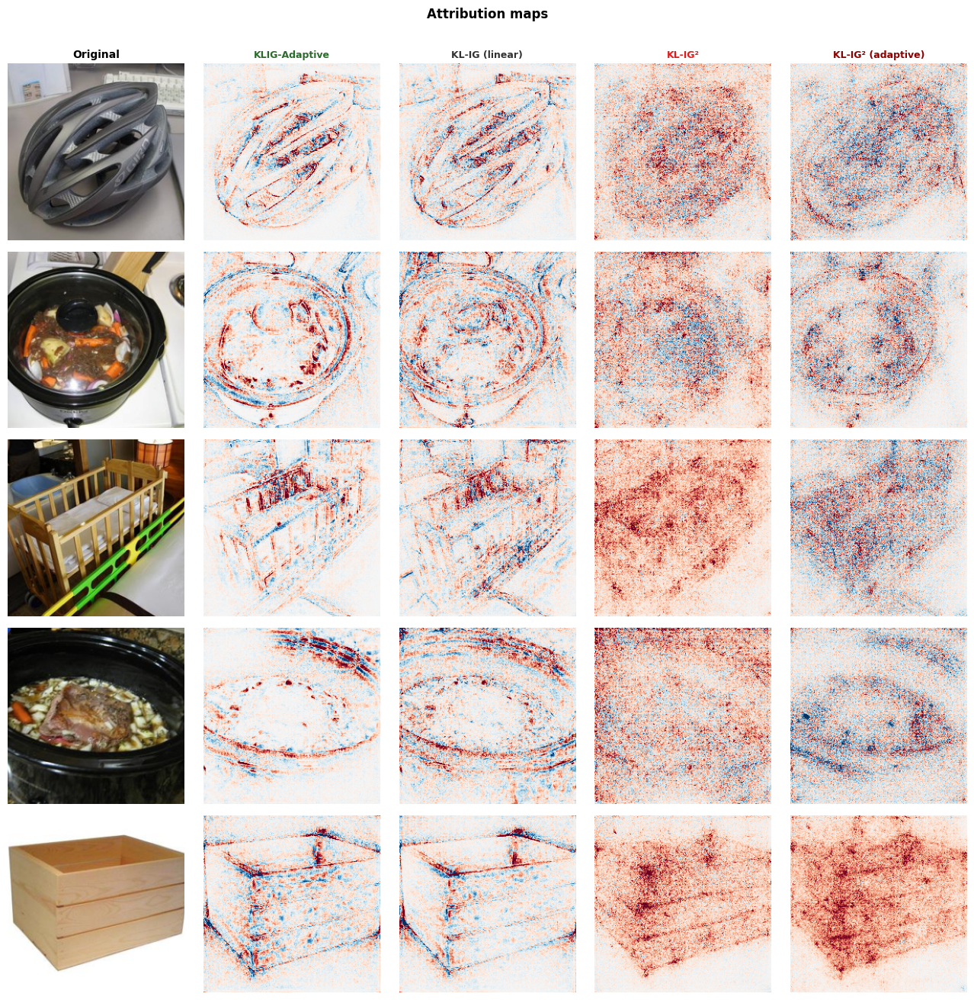

In [90]:
# ── Attribution maps ─────────────────────────────────────────────────────────
import random

N_VIS = 5
vis_idxs = random.sample(range(len(dataset)), min(N_VIS, len(dataset)))

fig, axes = plt.subplots(
    len(vis_idxs), 1 + len(METHODS),
    figsize=(2.6 * (1 + len(METHODS)), 2.6 * len(vis_idxs)),
    facecolor='white', squeeze=False,
)
for r, i in enumerate(vis_idxs):
    row_v   = dataset[i]
    img_np  = np.clip(denormalize(row_v['x'][0]).permute(1,2,0).numpy(), 0, 1)
    axes[r,0].imshow(img_np); axes[r,0].axis('off')
    axes[r,0].set_ylabel(imagenet_labels[row_v['target']][:18], fontsize=8)
    if r == 0: axes[r,0].set_title('Original', fontsize=10, fontweight='bold')
    for c, m in enumerate(METHODS, start=1):
        a    = all_attrs[m][i].numpy()
        vmax = max(float(np.percentile(np.abs(a), 99)), 1e-9)
        axes[r,c].imshow(a, cmap='RdBu_r', vmin=-vmax, vmax=vmax)
        axes[r,c].axis('off')
        if r == 0: axes[r,c].set_title(m, fontsize=9, fontweight='bold', color=COLORS[m])
plt.suptitle('Attribution maps', fontsize=12, fontweight='bold', y=1.005)
plt.tight_layout(); plt.show()

Image : tench  sigma_adapt=0.137  idx=0
KL-IG² (fixed)    path length: 50 steps
Building KL-IG² (adaptive) trajectory ... done (50 steps)
Computing cumulative attribution maps ...


methods:   0%|          | 0/4 [00:00<?, ?it/s]

Done.


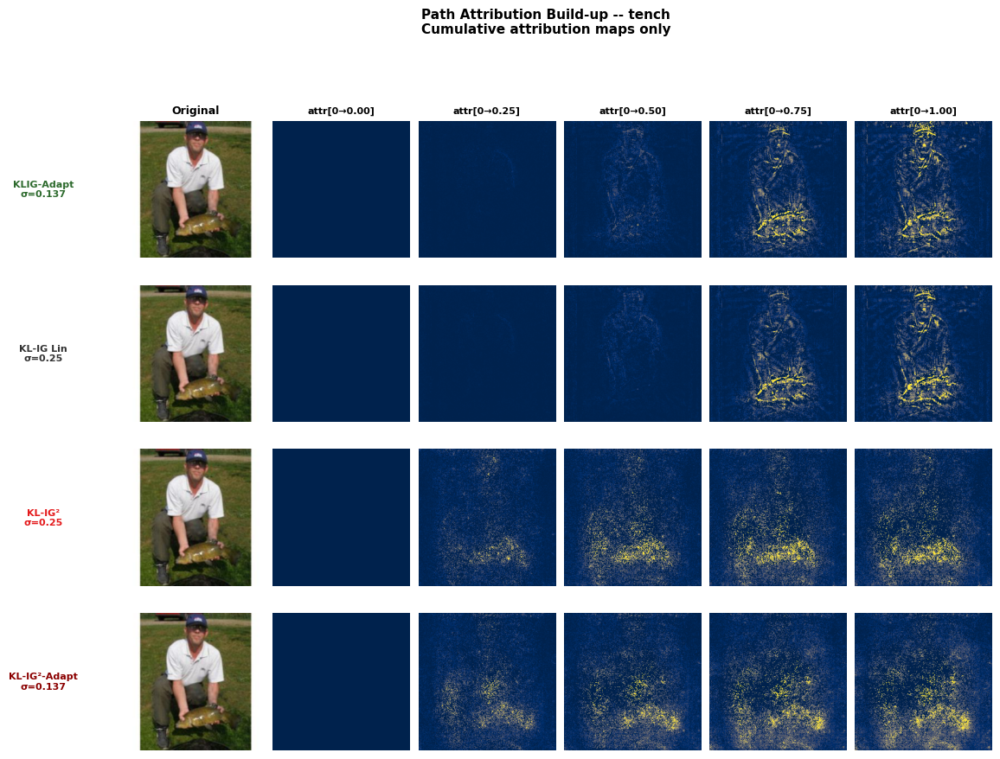

Saved path_buildup_klig_klig2_attr_only.png


In [ ]:
# -- Path Attribution Build-up -- KLIG & KL-IG2 all variants ------------------
# For each method, shows:
#   Left  : image x(t) along that method's path at t in [0, 0.25, 0.5, 0.75, 1.0]
#   Right : cumulative attribution accumulated from t=0 up to t
#
# KLIG methods (LinearPath)  -- path goes baseline(t=0) -> explicand(t=1)
# KL-IG2 methods (GradPath)  -- path goes explicand(t=0) -> GradCF(t=1)

_BUILDUP_METHODS = ['KLIG-Adaptive', 'KL-IG (linear)', 'KL-IG²', 'KL-IG² (adaptive)']
T_STEPS          = [0.0, 0.25, 0.5, 0.75, 1.0]
N_T              = len(T_STEPS)
N_MC_BUILDUP     = 10

# -- Pick one image -----------------------------------------------------------
BUILDUP_IDX = VIS_IMG_IDX

row_v   = dataset[BUILDUP_IDX]
x_viz   = row_v['x'].to(DEVICE)
x1_viz  = x_viz.squeeze(0)
tgt_viz = row_v['target']
meta_v  = all_path_meta[BUILDUP_IDX]

sig_adapt_viz = find_sigma_stop(
    model, x_viz, tgt_viz, tau=0.95, n_samples=32, n_iter=12)
lv_adapt_viz  = 2.0 * math.log(max(sig_adapt_viz, 1e-7))
lv_fixed_viz  = 2.0 * math.log(SIGMA_FINAL)

print(f'Image : {imagenet_labels[tgt_viz]}  '
      f'sigma_adapt={sig_adapt_viz:.3f}  idx={BUILDUP_IDX}')

# -- KL-IG² (fixed) trajectory -- from cached meta ---------------------------
_traj_key_mu  = 'traj_mu' if 'traj_mu' in meta_v else 'dist_traj_mu'
_traj_key_lv  = 'traj_lv' if 'traj_lv' in meta_v else 'dist_traj_lv'
traj_mu_fixed = [t.to(DEVICE) for t in meta_v[_traj_key_mu]]
traj_lv_fixed = [t.to(DEVICE) for t in meta_v[_traj_key_lv]]
K_fixed = len(traj_mu_fixed) - 1
print(f'KL-IG² (fixed)    path length: {K_fixed} steps')

# -- KL-IG² (adaptive) trajectory -- fresh descent ---------------------------
print('Building KL-IG² (adaptive) trajectory ...', end=' ', flush=True)
x_cf_viz = pick_cf_image(BUILDUP_IDX).squeeze(0).to(DEVICE)
_r_adapt_viz = KLIGSquared(
    model, phi, x_cf_viz,
    T=T_DESCENT, lr_mu=LR_MU, lr_lv=LR_LV,
    n_mc_path=N_MC_DESCENT, n_mc_grad=N_MC_BUILDUP,
    sigma_start=sig_adapt_viz, loss_stop=LOSS_STOP,
    lv_floor=2.0 * math.log(max(sig_adapt_viz, 1e-7)),
    lv_ceil=LV_CEIL, mu_min=MU_MIN, mu_max=MU_MAX,
    clamp_samples=True, device=DEVICE,
).attribute(x1_viz, target=tgt_viz)
traj_mu_adapt = _r_adapt_viz.traj_mu
traj_lv_adapt = _r_adapt_viz.traj_lv
K_adapt = len(traj_mu_adapt) - 1
print(f'done ({K_adapt} steps)')

# -- Helper: denorm -> HWC numpy [0, 1] ---------------------------------------
def _to_rgb(t_chw: torch.Tensor) -> np.ndarray:
    return denormalize(t_chw.cpu()).clamp(0, 1).permute(1, 2, 0).numpy()

# -- image_at(method, t) ------------------------------------------------------
# KLIG: linear fade-in from zero baseline to explicand
# KL-IG²: mu_k along descent trajectory (explicand -> GradCF)
def image_at(method: str, t: float) -> np.ndarray:
    if method in ('KLIG-Adaptive', 'KL-IG (linear)'):
        return _to_rgb(t * x1_viz)
    if method == 'KL-IG²':
        k = min(int(round(t * K_fixed)), K_fixed)
        return _to_rgb(traj_mu_fixed[k])
    if method == 'KL-IG² (adaptive)':
        k = min(int(round(t * K_adapt)), K_adapt)
        return _to_rgb(traj_mu_adapt[k])
    raise ValueError(method)

# -- Partial attribution [0 -> t_max] -----------------------------------------
def _partial_klig_lin(x1, target, lv_scalar, t_max,
                       n_steps=N_STEPS_INT, n_mc=N_MC_BUILDUP):
    """LinearPath cumulative attr for KLIG-Adaptive or KL-IG (linear)."""
    if t_max <= 0:
        return torch.zeros_like(x1)
    mu_f  = x1.detach()
    lv_f  = torch.full_like(mu_f, lv_scalar)
    attr  = torch.zeros_like(mu_f)
    saved = [p.requires_grad for p in model.parameters()]
    for p in model.parameters(): p.requires_grad_(False)
    try:
        for k in range(n_steps):
            t_k = (k + 0.5) / n_steps
            if t_k > t_max:
                break
            mu_t  = (t_k * mu_f).detach().requires_grad_(True)
            lv_t  = (t_k * lv_f).detach().requires_grad_(True)
            eps   = torch.randn(n_mc, *mu_f.shape, device=DEVICE)
            xsamp = mu_t.unsqueeze(0) + (0.5 * lv_t).exp().unsqueeze(0) * eps
            g_mu, g_lv = torch.autograd.grad(
                model(xsamp)[:, target].mean(), [mu_t, lv_t])
            with torch.no_grad():
                attr.add_(g_mu * mu_f + g_lv * lv_f)
    finally:
        for p, s in zip(model.parameters(), saved): p.requires_grad_(s)
    return (attr / n_steps).detach()


def _partial_klig2(target, traj_mu, traj_lv, t_max, n_mc=N_MC_BUILDUP):
    """KL-IG² cumulative attr_mu via backward displacement."""
    K = len(traj_mu) - 1
    if t_max <= 0 or K == 0:
        return torch.zeros_like(traj_mu[0])
    k_max   = max(1, min(int(round(t_max * K)), K))
    x_shape = traj_mu[0].shape
    attr_mu = torch.zeros_like(traj_mu[0])
    saved   = [p.requires_grad for p in model.parameters()]
    for p in model.parameters(): p.requires_grad_(False)
    try:
        for k in range(k_max):
            mu_k  = traj_mu[k].to(DEVICE)
            lv_k  = traj_lv[k].to(DEVICE)
            dmu_k = mu_k - traj_mu[k + 1].to(DEVICE)   # backward displacement
            mu_t  = mu_k.detach().requires_grad_(True)
            lv_t  = lv_k.detach().requires_grad_(True)
            eps   = torch.randn(n_mc, *x_shape, device=DEVICE)
            xsamp = mu_t.unsqueeze(0) + (0.5 * lv_t).exp().unsqueeze(0) * eps
            g_mu, _ = torch.autograd.grad(
                model(xsamp)[:, target].mean(), [mu_t, lv_t])
            with torch.no_grad():
                attr_mu.add_(g_mu * dmu_k)
    finally:
        for p, s in zip(model.parameters(), saved): p.requires_grad_(s)
    return attr_mu.detach()


def get_partial_attr(method: str, t_max: float) -> np.ndarray:
    if method == 'KLIG-Adaptive':
        a = _partial_klig_lin(x1_viz, tgt_viz, lv_adapt_viz, t_max)
    elif method == 'KL-IG (linear)':
        a = _partial_klig_lin(x1_viz, tgt_viz, lv_fixed_viz, t_max)
    elif method == 'KL-IG²':
        a = _partial_klig2(tgt_viz, traj_mu_fixed, traj_lv_fixed, t_max)
    elif method == 'KL-IG² (adaptive)':
        a = _partial_klig2(tgt_viz, traj_mu_adapt, traj_lv_adapt, t_max)
    else:
        raise ValueError(method)
    return absmax_collapse(a).clamp(min=0).cpu().numpy()

# -- Compute all (method x t) maps --------------------------------------------
print('Computing cumulative attribution maps ...')
buildup_maps = {m: [] for m in _BUILDUP_METHODS}
for m in tqdm(_BUILDUP_METHODS, desc='methods'):
    for t in T_STEPS:
        buildup_maps[m].append(get_partial_attr(m, t))
print('Done.')

# -- Render -------------------------------------------------------------------
# col 0 = original | cols 1..N_T = cumulative attribution attr[0->t]
N_ROWS = len(_BUILDUP_METHODS)
N_COLS = 1 + N_T

METHOD_LABELS = {
    'KLIG-Adaptive':     f'KLIG-Adapt\nσ={sig_adapt_viz:.3f}',
    'KL-IG (linear)':    f'KL-IG Lin\nσ={SIGMA_FINAL}',
    'KL-IG²':            f'KL-IG²\nσ={SIGMA_FINAL}',
    'KL-IG² (adaptive)': f'KL-IG²-Adapt\nσ={sig_adapt_viz:.3f}',
}

fig, axes = plt.subplots(
    N_ROWS,
    N_COLS,
    figsize=(2.15 * N_COLS, 2.4 * N_ROWS),
    facecolor='white',
    gridspec_kw={'wspace': 0.06, 'hspace': 0.12},
)

if N_ROWS == 1:
    axes = axes[np.newaxis, :]

img_orig = _to_rgb(x1_viz)

for mi, m in enumerate(_BUILDUP_METHODS):
    full_a = buildup_maps[m][-1]
    vmax = max(float(np.percentile(full_a, 99)), 1e-12)
    col = COLORS.get(m, 'black')

    # col 0: original image with row label
    ax0 = axes[mi, 0]
    ax0.imshow(img_orig)
    ax0.set_xticks([])
    ax0.set_yticks([])

    for sp in ax0.spines.values():
        sp.set_visible(False)

    ax0.set_ylabel(
        METHOD_LABELS[m],
        fontsize=8,
        color=col,
        fontweight='bold',
        rotation=0,
        labelpad=70,
        va='center'
    )

    if mi == 0:
        ax0.set_title('Original', fontsize=9, fontweight='bold')

    # cumulative attribution heatmaps only
    for ci, t in enumerate(T_STEPS):
        ax_attr = axes[mi, 1 + ci]

        ax_attr.imshow(
            buildup_maps[m][ci],
            cmap='cividis',
            vmin=0,
            vmax=vmax
        )

        ax_attr.set_xticks([])
        ax_attr.set_yticks([])

        for sp in ax_attr.spines.values():
            sp.set_visible(False)

        if mi == 0:
            ax_attr.set_title(
                f'attr[0→{t:.2f}]',
                fontsize=8,
                fontweight='bold'
            )

fig.suptitle(
    f'Path Attribution Build-up -- {imagenet_labels[tgt_viz]}\n'
    'Cumulative attribution maps only',
    fontsize=11,
    fontweight='bold',
    y=1.01,
)

plt.savefig(
    'path_buildup_klig_klig2_attr_only.png',
    dpi=150,
    bbox_inches='tight',
    facecolor='white'
)

plt.show()

print('Saved path_buildup_klig_klig2_attr_only.png')

In [ ]:
import os
os.chdir('/content/KLIG_V1/infocube-main')

# pull latest first
!git pull origin claude/general-session-FcgoB

%run toy_klig_klig2_heatmaps.py

remote: Enumerating objects: 7, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (1/1), done.
remote: Total 4 (delta 3), reused 4 (delta 3), pack-reused 0 (from 0)
Unpacking objects: 100% (4/4), 2.60 KiB | 2.60 MiB/s, done.
From https://github.com/Shameen5375/KLIG_V1
 * branch            claude/general-session-FcgoB -> FETCH_HEAD
   f9e0d22..0d35299  claude/general-session-FcgoB -> origin/claude/general-session-FcgoB
Updating f9e0d22..0d35299
Fast-forward
 infocube-main/toy_klig_klig2_heatmaps.py | 306 +++++++++++++------------------
 1 file changed, 128 insertions(+), 178 deletions(-)
[xor] computing heat + attributions on 100×100 grid ...
  done in 482.1s
[checkerboard] computing heat + attributions on 100×100 grid ...
  done in 549.9s
[diagonal_ckb] computing heat + attributions on 100×100 grid ...
  done in 614.4s
[radial] computing heat + attributions on 100×100 grid ...
  done in 546.2s
[flat_far_field] computing heat + attributions on 100×100 g

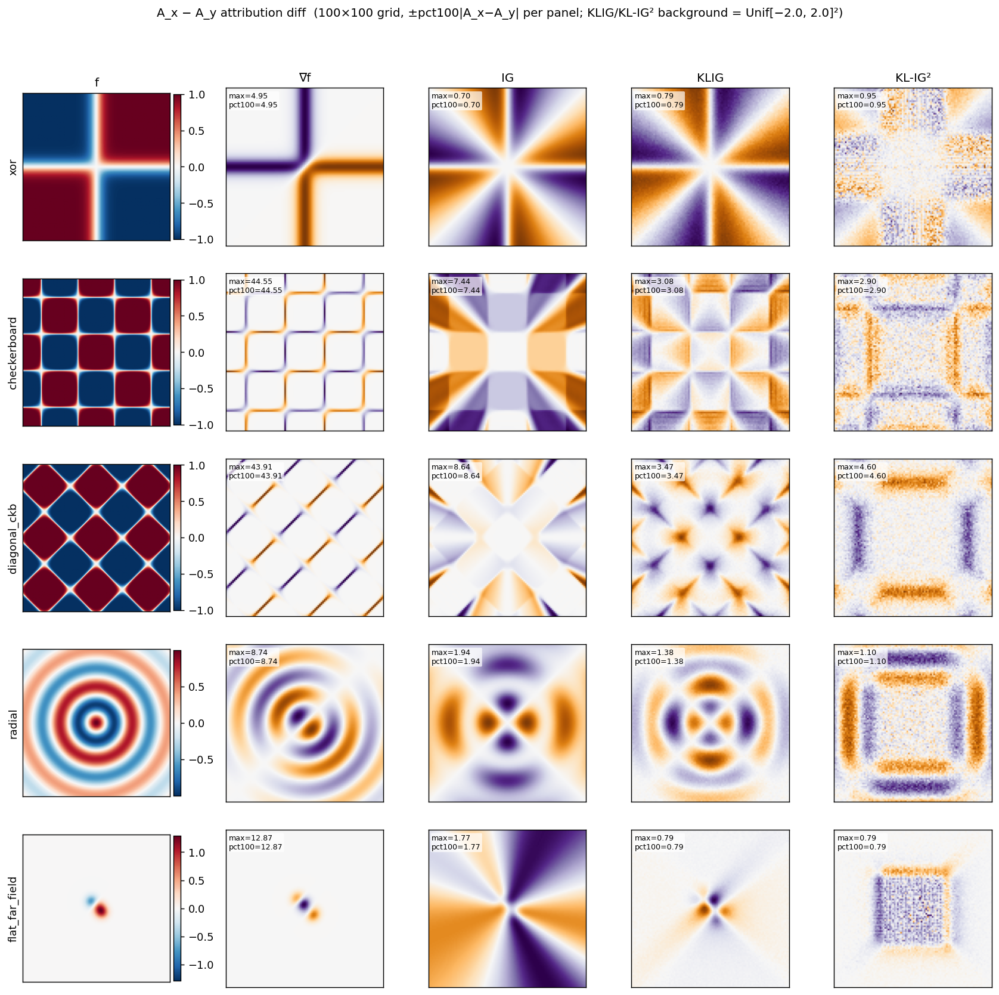

In [ ]:
from IPython.display import Image
Image('/content/KLIG_V1/infocube-main/results/toy_heatmap_attributions.png')

In [52]:
# ── Summary table ────────────────────────────────────────────────────────────
# Defensive: metric dicts (Gini/Ins/Del/Sens-n/OFR) are commented out by default,
# so guard each with globals().get(...). Re-enable those cells to populate them.
import pandas as pd
from scipy.stats import spearmanr as _sr

ci95 = lambda v: 1.96 * np.std(v) / len(v) ** 0.5

_gini = globals().get('gini_scores', {})
_ins  = globals().get('ins_auc', {})
_del  = globals().get('del_auc', {})
_sn   = globals().get('sens_n', {})
_ofr  = globals().get('ofr_scores', {})

rows_sum = []
for m in METHODS:
    r = {'Method': m}
    if _gini.get(m):
        v = _gini[m]; r['Gini ↑']    = f'{np.mean(v):.3f}±{ci95(v):.3f}'
    if _ins.get(m):
        v = _ins[m];  r['Ins AUC ↑'] = f'{np.mean(v):.3f}±{ci95(v):.3f}'
    if _del.get(m):
        v = _del[m];  r['Del AUC ↓'] = f'{np.mean(v):.3f}±{ci95(v):.3f}'
    if _sn.get(m):
        v = _sn[m];   r['Sens-n ↑']  = f'{np.mean(v):.3f}±{ci95(v):.3f}'
    if _ofr.get(m):
        v = _ofr[m];  r['OFR ↑']     = f'{np.mean(v):.3f}±{ci95(v):.3f}'
    if scatter_all.get(m):
        pts   = scatter_all[m]
        dists = np.array([p[0] for p in pts])
        divs  = np.array([p[1] for p in pts])
        rho_, _ = _sr(dists, divs)
        r['|CS ρ| ↑'] = f'{abs(rho_):.3f}'   # magnitude, matches eval notebook
    rows_sum.append(r)

df = pd.DataFrame(rows_sum).set_index('Method')
print(df.to_string())
df


NameError: name 'gini_scores' is not defined